<a href="https://colab.research.google.com/github/RobertFlan02/Dietetics-FYP/blob/main/Experiments/DeepLab/Experiment%207/DeeLabExperiment7.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!pip install bayesian-optimization -q

In [2]:
!kaggle datasets download -d eather00/eduardopachecofoodseg103

Dataset URL: https://www.kaggle.com/datasets/eather00/eduardopachecofoodseg103
License(s): apache-2.0
100% 1.16G/1.16G [00:49<00:00, 29.3MB/s]
100% 1.16G/1.16G [00:49<00:00, 25.0MB/s]


In [4]:
import zipfile
with zipfile.ZipFile('eduardopachecofoodseg103.zip', 'r') as zip_ref:
    zip_ref.extractall('foodseg103')

Despite the adding of new hyperparemeters we have not used any basian optimization for this expierment as we want to see if the new hyperparamters are having any improvement before dedciating time to optimizing them

In [ ]:

# Imports
import os
import io
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
from tqdm import tqdm
from sklearn.model_selection import train_test_split

from bayes_opt import BayesianOptimization

# Helper Functions & Classes
def compute_metrics_from_confusion(conf_matrix):
    """Compute pixel accuracy, mean IoU, and mean Dice from a confusion matrix."""
    pixel_acc = np.trace(conf_matrix) / conf_matrix.sum() if conf_matrix.sum() > 0 else 0
    iou_list = []
    dice_list = []
    for i in range(conf_matrix.shape[0]):
        intersection = conf_matrix[i, i]
        union = conf_matrix[i, :].sum() + conf_matrix[:, i].sum() - conf_matrix[i, i]
        if union == 0:
            iou = np.nan
            dice = np.nan
        else:
            iou = intersection / union
            dice = 2 * intersection / (conf_matrix[i, :].sum() + conf_matrix[:, i].sum())
        iou_list.append(iou)
        dice_list.append(dice)
    mean_iou = np.nanmean(iou_list)
    mean_dice = np.nanmean(dice_list)
    return pixel_acc, mean_iou, mean_dice

def dice_loss_fn(pred, target, smooth=1e-6):
    """
    Computes Dice loss.
      - pred: logits from the model, shape [N, C, H, W]
      - target: ground truth labels, shape [N, H, W]
    """
    pred = torch.softmax(pred, dim=1)
    target_one_hot = torch.nn.functional.one_hot(target, num_classes=pred.shape[1])\
                           .permute(0, 3, 1, 2).float().to(pred.device)
    intersection = (pred * target_one_hot).sum(dim=(2, 3))
    union = pred.sum(dim=(2, 3)) + target_one_hot.sum(dim=(2, 3))
    dice = (2. * intersection + smooth) / (union + smooth)
    return 1 - dice.mean()

def classification_loss_fn(outputs, masks, num_classes):
    """
    Computes a KL divergence loss between the predicted global class distribution (ignoring background)
    and the target distribution derived from the mask.
    """
    p_pred = torch.softmax(outputs, dim=1).mean(dim=[2,3])  
    p_pred = p_pred[:, 1:]  # ignore background
    N = masks.size(0)
    target = torch.zeros((N, num_classes - 1), device=masks.device)
    masks_np = masks.cpu().numpy()
    for i in range(N):
        unique = np.unique(masks_np[i])
        for cls in unique:
            cls = int(cls)
            if cls > 0:
                target[i, cls - 1] = 1
        s = target[i].sum()
        if s > 0:
            target[i] /= s
    loss_cls = nn.functional.kl_div(p_pred.log(), target, reduction='batchmean')
    return loss_cls

# Responsible for computing the boundary loss
def boundary_loss_fn(pred, target):
    pred = torch.softmax(pred, dim=1) 
    # Define a 3x3 Laplacian kernel.
    laplacian_kernel = torch.tensor([[0, 1, 0],
                                     [1, -4, 1],
                                     [0, 1, 0]], dtype=pred.dtype, device=pred.device).view(1,1,3,3)
    boundaries_pred = []
    for c in range(pred.shape[1]):
        channel_pred = pred[:, c:c+1, :, :]
        boundary_c = torch.abs(torch.nn.functional.conv2d(channel_pred, laplacian_kernel, padding=1))
        boundaries_pred.append(boundary_c)
    boundaries_pred = torch.cat(boundaries_pred, dim=1)  # [N, C, H, W]

    target_one_hot = torch.nn.functional.one_hot(target, num_classes=pred.shape[1])\
                           .permute(0, 3, 1, 2).float().to(pred.device)
    boundaries_target = []
    for c in range(target_one_hot.shape[1]):
        channel_target = target_one_hot[:, c:c+1, :, :]
        boundary_c = torch.abs(torch.nn.functional.conv2d(channel_target, laplacian_kernel, padding=1))
        boundaries_target.append(boundary_c)
    boundaries_target = torch.cat(boundaries_target, dim=1)

    loss_boundary = torch.nn.functional.l1_loss(boundaries_pred, boundaries_target)
    return loss_boundary

class JointTransform:
    def __init__(self, flip_prob=0.5, rotation_degrees=0):
        self.flip_prob = flip_prob
        self.rotation_degrees = rotation_degrees

    def __call__(self, img, mask):
        if np.random.random() < self.flip_prob:
            img = transforms.functional.hflip(img)
            mask = transforms.functional.hflip(mask)
        if self.rotation_degrees:
            angle = np.random.uniform(-self.rotation_degrees, self.rotation_degrees)
            img = transforms.functional.rotate(img, angle, interpolation=Image.BILINEAR, expand=True)
            mask = transforms.functional.rotate(mask, angle, interpolation=Image.NEAREST, expand=True)
        return img, mask

class FoodSegDataset(Dataset):
    def __init__(self, dataframe, img_transform=None, mask_resize=None, joint_transform=None):
        self.df = dataframe
        self.img_transform = img_transform
        self.mask_resize = mask_resize
        self.joint_transform = joint_transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        image_dict = row['image']
        img = Image.open(io.BytesIO(image_dict.get("bytes"))).convert("RGB")
        label_dict = row['label']
        mask = Image.open(io.BytesIO(label_dict.get("bytes")))
        if self.joint_transform is not None:
            img, mask = self.joint_transform(img, mask)
        if self.mask_resize:
            mask = self.mask_resize(mask)
        if self.img_transform:
            img = self.img_transform(img)
        mask = torch.from_numpy(np.array(mask)).long()
        return img, mask


# Data Loading
class_mappings = pd.read_csv('/content/foodseg103/class_mappings.csv')
id_to_food = dict(zip(class_mappings["Class Id"], class_mappings["Class Name"]))

train_files = [
    '/content/foodseg103/train-00000-of-00003-6bb37ec387d1825a.parquet',
    '/content/foodseg103/train-00001-of-00003-4a1caa37147c0681.parquet',
    '/content/foodseg103/train-00002-of-00003-c8b698399244cd95.parquet'
]
train_dfs = [pd.read_parquet(f) for f in train_files]
full_train_df = pd.concat(train_dfs, ignore_index=True)
print("Full training data shape:", full_train_df.shape)

train_df, test_df = train_test_split(full_train_df, test_size=0.2, random_state=42)
print("Training set shape:", train_df.shape)
print("Testing set shape:", test_df.shape)

# Sets a small subset of the data for faster hyperparameter tuning.
train_df_small = train_df.head(500)   
test_df_small = test_df.head(200)       

# Bayesian Optimization Objective Function
def train_evaluate(learning_rate, flip_prob, rotation_degrees, img_scale, weight_decay,
                   dice_weight, cls_loss_weight, unfreeze_frac, boundary_loss_weight):
    rotation_degrees = int(round(rotation_degrees))
    effective_img_size = (int(round(513 * img_scale)), int(round(513 * img_scale)))

    local_hparams = {
        "img_size": effective_img_size,
        "batch_size": 4,
        "num_epochs": 5,  
        "learning_rate": learning_rate,
        "num_workers": 1,
        "num_classes": 104,
        "use_amp": True,
        "flip_prob": flip_prob,
        "rotation_degrees": rotation_degrees,
        "weight_decay": weight_decay,
        "dice_weight": dice_weight,
        "cls_loss_weight": cls_loss_weight,
        "unfreeze_frac": unfreeze_frac,
        "boundary_loss_weight": boundary_loss_weight
    }

    img_transform_local = transforms.Compose([
        transforms.Resize(local_hparams["img_size"]),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std=[0.229, 0.224, 0.225]),
    ])
    mask_resize_local = transforms.Resize(local_hparams["img_size"], interpolation=Image.NEAREST)
    joint_transform_local = JointTransform(
        flip_prob=local_hparams["flip_prob"],
        rotation_degrees=local_hparams["rotation_degrees"]
    )

    train_dataset_local = FoodSegDataset(train_df_small,
                                         img_transform=img_transform_local,
                                         mask_resize=mask_resize_local,
                                         joint_transform=joint_transform_local)
    train_loader_local = DataLoader(train_dataset_local,
                                    batch_size=local_hparams["batch_size"],
                                    shuffle=True,
                                    num_workers=local_hparams["num_workers"])

    test_dataset_local = FoodSegDataset(test_df_small,
                                        img_transform=img_transform_local,
                                        mask_resize=mask_resize_local,
                                        joint_transform=None)
    test_loader_local = DataLoader(test_dataset_local,
                                   batch_size=local_hparams["batch_size"],
                                   shuffle=False,
                                   num_workers=local_hparams["num_workers"])

    # Build the deeplab model
    model_local = torch.hub.load('pytorch/vision:v0.10.0', 'deeplabv3_resnet50', pretrained=True)
    # Initially freeze entire backbone.
    for param in model_local.backbone.parameters():
        param.requires_grad = False
    # Unfreeze the last fraction of backbone layers.
    unfreeze_frac = local_hparams["unfreeze_frac"]
    children = list(model_local.backbone.children())
    n_children = len(children)
    n_unfreeze = int(unfreeze_frac * n_children)
    print(f"[BO] Unfreezing last {n_unfreeze} layers out of {n_children} in backbone.")
    if n_unfreeze > 0:
        for child in children[-n_unfreeze:]:
            for param in child.parameters():
                param.requires_grad = True

    model_local.classifier[4] = nn.Conv2d(256, local_hparams["num_classes"], kernel_size=1)

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model_local = model_local.to(device)

    criterion_local = nn.CrossEntropyLoss()
    optimizer_local = optim.Adam(filter(lambda p: p.requires_grad, model_local.parameters()),
                                 lr=local_hparams["learning_rate"],
                                 weight_decay=local_hparams["weight_decay"])
    scheduler_local = ReduceLROnPlateau(optimizer_local, mode='min', factor=0.5, patience=1, verbose=False)
    scaler_local = torch.cuda.amp.GradScaler() if local_hparams["use_amp"] and device.type == 'cuda' else None

    # Training Loop
    model_local.train()
    for epoch in range(local_hparams["num_epochs"]):
        for images, masks in train_loader_local:
            images = images.to(device)
            masks = masks.to(device)
            optimizer_local.zero_grad()
            if scaler_local is not None:
                with torch.cuda.amp.autocast():
                    outputs = model_local(images)['out']
                    loss_ce = criterion_local(outputs, masks)
                    loss_dice = dice_loss_fn(outputs, masks)
                    loss_cls = classification_loss_fn(outputs, masks, local_hparams["num_classes"])
                    loss_boundary = boundary_loss_fn(outputs, masks)
                    loss = loss_ce + local_hparams["dice_weight"] * loss_dice \
                           + local_hparams["cls_loss_weight"] * loss_cls \
                           + local_hparams["boundary_loss_weight"] * loss_boundary
                scaler_local.scale(loss).backward()
                scaler_local.step(optimizer_local)
                scaler_local.update()
            else:
                outputs = model_local(images)['out']
                loss_ce = criterion_local(outputs, masks)
                loss_dice = dice_loss_fn(outputs, masks)
                loss_cls = classification_loss_fn(outputs, masks, local_hparams["num_classes"])
                loss_boundary = boundary_loss_fn(outputs, masks)
                loss = loss_ce + local_hparams["dice_weight"] * loss_dice \
                           + local_hparams["cls_loss_weight"] * loss_cls \
                           + local_hparams["boundary_loss_weight"] * loss_boundary
                loss.backward()
                optimizer_local.step()
        scheduler_local.step(loss.item())

    # Evaluation Loop
    model_local.eval()
    test_conf_matrix = np.zeros((local_hparams["num_classes"], local_hparams["num_classes"]), dtype=np.int64)
    with torch.no_grad():
        for images, masks in test_loader_local:
            images = images.to(device)
            masks = masks.to(device)
            outputs = model_local(images)['out']
            preds = outputs.argmax(dim=1).detach().cpu().numpy()
            targets = masks.detach().cpu().numpy()
            preds_flat = preds.flatten()
            targets_flat = targets.flatten()
            batch_conf = np.bincount(
                local_hparams["num_classes"] * targets_flat + preds_flat,
                minlength=local_hparams["num_classes"]**2
            ).reshape(local_hparams["num_classes"], local_hparams["num_classes"])
            test_conf_matrix += batch_conf

    _, test_mean_iou, _ = compute_metrics_from_confusion(test_conf_matrix)
    return test_mean_iou


# Bayesian Optimization Setup
pbounds = {
    'learning_rate': (0.0006, 0.0008),
    'flip_prob': (0.2, 0.4),
    'rotation_degrees': (10, 20),
    'img_scale': (0.82, 0.98),
    'weight_decay': (1e-4, 2e-4),
    'dice_weight': (0.7, 1.0),
    'cls_loss_weight': (0.2, 1.0),
    'unfreeze_frac': (0.2, 0.4),
    'boundary_loss_weight': (0.1, 0.5)
}

optimizer_bo = BayesianOptimization(
    f=train_evaluate,
    pbounds=pbounds,
    random_state=42,
)

print("Starting Bayesian Optimization...")
optimizer_bo.maximize(
    init_points=5,  # Number of random initial points.
    n_iter=10       # Number of optimization iterations.
)

print("Best result found:")
print(optimizer_bo.max)


ModuleNotFoundError: No module named 'bayes_opt'

The key changes to the training code is we have added some new regurlization techniques to help with the overfitting visiible in the last model these being color jitter and dropout rate. I have also changed increased the classidication loss weight manually as it seemed to be  underperforming compared to the other loss metrics.
additionaly we have doubled batch size to try better utilize the GPU to speed up training. As a result we have doubled the learning rate also



These changes resulted in a model with slightly worse performance and overfitting still present


Using Hyperparameters:
  img_scale: 0.9208
  batch_size: 8
  num_epochs: 30
  learning_rate: 0.0012432
  weight_decay: 0.0001919
  num_workers: 1
  num_classes: 104
  use_amp: True
  flip_prob: 0.3935
  rotation_degrees: 18.69
  dice_weight: 1.0
  cls_loss_weight: 0.7
  unfreeze_frac: 0.2024
  boundary_loss_weight: 0.1577
  dropout_rate: 0.3
  color_jitter_brightness: 0.2
  color_jitter_contrast: 0.2
  color_jitter_saturation: 0.2
  color_jitter_hue: 0.1
  img_size: (472, 472)
Full training data shape: (4983, 2)
Training set shape: (3986, 2)
Testing set shape: (997, 2)


Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
<ipython-input-8-ce3a9978f2b7>:310: FutureWarning: `torch.cuda.amp.GradScaler(args...)`

Unfreezing last 1 layers out of 8 in backbone.


Epoch 1/30 [Training]:   0%|          | 0/499 [00:00<?, ?it/s]<ipython-input-8-ce3a9978f2b7>:349: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Epoch 1/30 [Training]: 100%|██████████| 499/499 [29:07<00:00,  3.50s/it, loss=4.3391]


Epoch [1/30], Train Loss: 5.0435, Pixel Acc: 0.6161, mIoU: 0.0193, mDice: 0.0295


Epoch 1/30 [Testing]: 100%|██████████| 125/125 [02:22<00:00,  1.14s/it, loss=4.1355]


Epoch [1/30], Test Loss: 5.0381, Pixel Acc: 0.5505, mIoU: 0.0233, mDice: 0.0354
New best model found and saved with Test Loss: 5.0381


Epoch 2/30 [Training]: 100%|██████████| 499/499 [29:03<00:00,  3.49s/it, loss=5.6583]


Epoch [2/30], Train Loss: 4.6603, Pixel Acc: 0.6372, mIoU: 0.0376, mDice: 0.0604


Epoch 2/30 [Testing]: 100%|██████████| 125/125 [02:21<00:00,  1.13s/it, loss=3.7352]


Epoch [2/30], Test Loss: 4.5989, Pixel Acc: 0.5895, mIoU: 0.0597, mDice: 0.0912
New best model found and saved with Test Loss: 4.5989


Epoch 3/30 [Training]: 100%|██████████| 499/499 [28:58<00:00,  3.48s/it, loss=4.4077]


Epoch [3/30], Train Loss: 4.4357, Pixel Acc: 0.6533, mIoU: 0.0564, mDice: 0.0898


Epoch 3/30 [Testing]: 100%|██████████| 125/125 [02:21<00:00,  1.13s/it, loss=3.8386]


Epoch [3/30], Test Loss: 4.3406, Pixel Acc: 0.6073, mIoU: 0.0795, mDice: 0.1209
New best model found and saved with Test Loss: 4.3406


Epoch 4/30 [Training]: 100%|██████████| 499/499 [28:51<00:00,  3.47s/it, loss=4.3093]


Epoch [4/30], Train Loss: 4.2883, Pixel Acc: 0.6620, mIoU: 0.0692, mDice: 0.1097


Epoch 4/30 [Testing]: 100%|██████████| 125/125 [02:20<00:00,  1.13s/it, loss=3.9207]


Epoch [4/30], Test Loss: 4.2211, Pixel Acc: 0.6300, mIoU: 0.0945, mDice: 0.1432
New best model found and saved with Test Loss: 4.2211


Epoch 5/30 [Training]: 100%|██████████| 499/499 [28:45<00:00,  3.46s/it, loss=3.8118]


Epoch [5/30], Train Loss: 4.1925, Pixel Acc: 0.6709, mIoU: 0.0788, mDice: 0.1246


Epoch 5/30 [Testing]: 100%|██████████| 125/125 [02:20<00:00,  1.12s/it, loss=3.5749]


Epoch [5/30], Test Loss: 4.1648, Pixel Acc: 0.6313, mIoU: 0.1038, mDice: 0.1543
New best model found and saved with Test Loss: 4.1648


Epoch 6/30 [Training]: 100%|██████████| 499/499 [28:44<00:00,  3.46s/it, loss=4.3227]


Epoch [6/30], Train Loss: 4.0893, Pixel Acc: 0.6754, mIoU: 0.0922, mDice: 0.1457


Epoch 6/30 [Testing]: 100%|██████████| 125/125 [02:20<00:00,  1.12s/it, loss=4.0069]


Epoch [6/30], Test Loss: 4.2442, Pixel Acc: 0.6296, mIoU: 0.1093, mDice: 0.1643


Epoch 7/30 [Training]: 100%|██████████| 499/499 [28:42<00:00,  3.45s/it, loss=3.5285]


Epoch [7/30], Train Loss: 4.0357, Pixel Acc: 0.6784, mIoU: 0.0971, mDice: 0.1526


Epoch 7/30 [Testing]: 100%|██████████| 125/125 [02:19<00:00,  1.12s/it, loss=3.1055]


Epoch [7/30], Test Loss: 3.9994, Pixel Acc: 0.6501, mIoU: 0.1231, mDice: 0.1835
New best model found and saved with Test Loss: 3.9994


Epoch 8/30 [Training]: 100%|██████████| 499/499 [28:41<00:00,  3.45s/it, loss=4.3630]


Epoch [8/30], Train Loss: 3.9777, Pixel Acc: 0.6842, mIoU: 0.1061, mDice: 0.1660


Epoch 8/30 [Testing]: 100%|██████████| 125/125 [02:19<00:00,  1.12s/it, loss=3.3493]


Epoch [8/30], Test Loss: 3.9863, Pixel Acc: 0.6504, mIoU: 0.1281, mDice: 0.1921
New best model found and saved with Test Loss: 3.9863


Epoch 9/30 [Training]: 100%|██████████| 499/499 [28:41<00:00,  3.45s/it, loss=4.9543]


Epoch [9/30], Train Loss: 3.9290, Pixel Acc: 0.6879, mIoU: 0.1117, mDice: 0.1753


Epoch 9/30 [Testing]: 100%|██████████| 125/125 [02:19<00:00,  1.11s/it, loss=3.2308]


Epoch [9/30], Test Loss: 3.9130, Pixel Acc: 0.6535, mIoU: 0.1365, mDice: 0.2018
New best model found and saved with Test Loss: 3.9130


Epoch 10/30 [Training]: 100%|██████████| 499/499 [28:40<00:00,  3.45s/it, loss=3.8417]


Epoch [10/30], Train Loss: 3.8672, Pixel Acc: 0.6904, mIoU: 0.1170, mDice: 0.1830


Epoch 10/30 [Testing]: 100%|██████████| 125/125 [02:19<00:00,  1.11s/it, loss=3.1273]


Epoch [10/30], Test Loss: 4.0108, Pixel Acc: 0.6499, mIoU: 0.1355, mDice: 0.2020


Epoch 11/30 [Training]: 100%|██████████| 499/499 [28:39<00:00,  3.45s/it, loss=4.0890]


Epoch [11/30], Train Loss: 3.8321, Pixel Acc: 0.6935, mIoU: 0.1241, mDice: 0.1931


Epoch 11/30 [Testing]: 100%|██████████| 125/125 [02:18<00:00,  1.11s/it, loss=3.2662]


Epoch [11/30], Test Loss: 3.9481, Pixel Acc: 0.6489, mIoU: 0.1412, mDice: 0.2114


Epoch 12/30 [Training]: 100%|██████████| 499/499 [28:40<00:00,  3.45s/it, loss=4.5604]


Epoch [12/30], Train Loss: 3.6656, Pixel Acc: 0.7071, mIoU: 0.1448, mDice: 0.2227


Epoch 12/30 [Testing]: 100%|██████████| 125/125 [02:18<00:00,  1.11s/it, loss=3.1648]


Epoch [12/30], Test Loss: 3.8012, Pixel Acc: 0.6703, mIoU: 0.1563, mDice: 0.2313
New best model found and saved with Test Loss: 3.8012


Epoch 13/30 [Training]: 100%|██████████| 499/499 [28:39<00:00,  3.45s/it, loss=5.5272]


Epoch [13/30], Train Loss: 3.6235, Pixel Acc: 0.7098, mIoU: 0.1516, mDice: 0.2333


Epoch 13/30 [Testing]: 100%|██████████| 125/125 [02:18<00:00,  1.11s/it, loss=3.1809]


Epoch [13/30], Test Loss: 3.7902, Pixel Acc: 0.6699, mIoU: 0.1626, mDice: 0.2408
New best model found and saved with Test Loss: 3.7902


Epoch 14/30 [Training]: 100%|██████████| 499/499 [28:40<00:00,  3.45s/it, loss=3.7676]


Epoch [14/30], Train Loss: 3.5859, Pixel Acc: 0.7110, mIoU: 0.1565, mDice: 0.2396


Epoch 14/30 [Testing]: 100%|██████████| 125/125 [02:18<00:00,  1.11s/it, loss=3.4456]


Epoch [14/30], Test Loss: 3.7820, Pixel Acc: 0.6709, mIoU: 0.1660, mDice: 0.2441
New best model found and saved with Test Loss: 3.7820


Epoch 15/30 [Training]: 100%|██████████| 499/499 [28:39<00:00,  3.45s/it, loss=4.0627]


Epoch [15/30], Train Loss: 3.5557, Pixel Acc: 0.7141, mIoU: 0.1639, mDice: 0.2502


Epoch 15/30 [Testing]: 100%|██████████| 125/125 [02:18<00:00,  1.11s/it, loss=3.4424]


Epoch [15/30], Test Loss: 3.7940, Pixel Acc: 0.6684, mIoU: 0.1644, mDice: 0.2424


Epoch 16/30 [Training]: 100%|██████████| 499/499 [28:39<00:00,  3.45s/it, loss=5.2801]


Epoch [16/30], Train Loss: 3.5335, Pixel Acc: 0.7140, mIoU: 0.1672, mDice: 0.2554


Epoch 16/30 [Testing]: 100%|██████████| 125/125 [02:18<00:00,  1.11s/it, loss=3.3034]


Epoch [16/30], Test Loss: 3.7770, Pixel Acc: 0.6706, mIoU: 0.1653, mDice: 0.2458
New best model found and saved with Test Loss: 3.7770


Epoch 17/30 [Training]: 100%|██████████| 499/499 [28:39<00:00,  3.45s/it, loss=3.2148]


Epoch [17/30], Train Loss: 3.4746, Pixel Acc: 0.7183, mIoU: 0.1777, mDice: 0.2701


Epoch 17/30 [Testing]: 100%|██████████| 125/125 [02:18<00:00,  1.11s/it, loss=3.3735]


Epoch [17/30], Test Loss: 3.8099, Pixel Acc: 0.6703, mIoU: 0.1771, mDice: 0.2622


Epoch 18/30 [Training]: 100%|██████████| 499/499 [28:40<00:00,  3.45s/it, loss=3.5363]


Epoch [18/30], Train Loss: 3.4678, Pixel Acc: 0.7177, mIoU: 0.1833, mDice: 0.2785


Epoch 18/30 [Testing]: 100%|██████████| 125/125 [02:18<00:00,  1.11s/it, loss=3.2057]


Epoch [18/30], Test Loss: 3.7848, Pixel Acc: 0.6671, mIoU: 0.1761, mDice: 0.2615


Epoch 19/30 [Training]: 100%|██████████| 499/499 [28:38<00:00,  3.44s/it, loss=4.0770]


Epoch [19/30], Train Loss: 3.3486, Pixel Acc: 0.7295, mIoU: 0.1983, mDice: 0.2984


Epoch 19/30 [Testing]: 100%|██████████| 125/125 [02:18<00:00,  1.11s/it, loss=3.3709]


Epoch [19/30], Test Loss: 3.7363, Pixel Acc: 0.6750, mIoU: 0.1849, mDice: 0.2730
New best model found and saved with Test Loss: 3.7363


Epoch 20/30 [Training]: 100%|██████████| 499/499 [28:38<00:00,  3.44s/it, loss=4.8254]


Epoch [20/30], Train Loss: 3.3084, Pixel Acc: 0.7331, mIoU: 0.2067, mDice: 0.3100


Epoch 20/30 [Testing]: 100%|██████████| 125/125 [02:18<00:00,  1.11s/it, loss=3.1557]


Epoch [20/30], Test Loss: 3.7013, Pixel Acc: 0.6779, mIoU: 0.1838, mDice: 0.2725
New best model found and saved with Test Loss: 3.7013


Epoch 21/30 [Training]: 100%|██████████| 499/499 [28:38<00:00,  3.44s/it, loss=3.9716]


Epoch [21/30], Train Loss: 3.2824, Pixel Acc: 0.7343, mIoU: 0.2106, mDice: 0.3154


Epoch 21/30 [Testing]: 100%|██████████| 125/125 [02:18<00:00,  1.10s/it, loss=3.1888]


Epoch [21/30], Test Loss: 3.7231, Pixel Acc: 0.6770, mIoU: 0.1822, mDice: 0.2694


Epoch 22/30 [Training]: 100%|██████████| 499/499 [28:38<00:00,  3.44s/it, loss=3.7043]


Epoch [22/30], Train Loss: 3.2612, Pixel Acc: 0.7364, mIoU: 0.2156, mDice: 0.3224


Epoch 22/30 [Testing]: 100%|██████████| 125/125 [02:18<00:00,  1.10s/it, loss=3.0619]


Epoch [22/30], Test Loss: 3.7046, Pixel Acc: 0.6784, mIoU: 0.1868, mDice: 0.2744


Epoch 23/30 [Training]: 100%|██████████| 499/499 [28:38<00:00,  3.44s/it, loss=3.3025]


Epoch [23/30], Train Loss: 3.1774, Pixel Acc: 0.7433, mIoU: 0.2295, mDice: 0.3406


Epoch 23/30 [Testing]: 100%|██████████| 125/125 [02:18<00:00,  1.10s/it, loss=3.3052]


Epoch [23/30], Test Loss: 3.7123, Pixel Acc: 0.6776, mIoU: 0.1945, mDice: 0.2873


Epoch 24/30 [Training]: 100%|██████████| 499/499 [28:39<00:00,  3.45s/it, loss=3.8515]


Epoch [24/30], Train Loss: 3.1557, Pixel Acc: 0.7467, mIoU: 0.2324, mDice: 0.3446


Epoch 24/30 [Testing]: 100%|██████████| 125/125 [02:18<00:00,  1.10s/it, loss=3.1245]


Epoch [24/30], Test Loss: 3.7289, Pixel Acc: 0.6803, mIoU: 0.1943, mDice: 0.2866


Epoch 25/30 [Training]: 100%|██████████| 499/499 [28:39<00:00,  3.45s/it, loss=3.1133]


Epoch [25/30], Train Loss: 3.1107, Pixel Acc: 0.7498, mIoU: 0.2444, mDice: 0.3604


Epoch 25/30 [Testing]: 100%|██████████| 125/125 [02:18<00:00,  1.10s/it, loss=3.1671]


Epoch [25/30], Test Loss: 3.6694, Pixel Acc: 0.6820, mIoU: 0.1984, mDice: 0.2920
New best model found and saved with Test Loss: 3.6694


Epoch 26/30 [Training]: 100%|██████████| 499/499 [28:38<00:00,  3.44s/it, loss=3.6583]


Epoch [26/30], Train Loss: 3.0902, Pixel Acc: 0.7532, mIoU: 0.2478, mDice: 0.3647


Epoch 26/30 [Testing]: 100%|██████████| 125/125 [02:18<00:00,  1.10s/it, loss=3.2032]


Epoch [26/30], Test Loss: 3.6696, Pixel Acc: 0.6819, mIoU: 0.1980, mDice: 0.2906


Epoch 27/30 [Training]: 100%|██████████| 499/499 [28:39<00:00,  3.45s/it, loss=3.1171]


Epoch [27/30], Train Loss: 3.0893, Pixel Acc: 0.7541, mIoU: 0.2499, mDice: 0.3681


Epoch 27/30 [Testing]: 100%|██████████| 125/125 [02:18<00:00,  1.10s/it, loss=3.2912]


Epoch [27/30], Test Loss: 3.7276, Pixel Acc: 0.6777, mIoU: 0.1956, mDice: 0.2886


Epoch 28/30 [Training]: 100%|██████████| 499/499 [28:39<00:00,  3.45s/it, loss=2.9503]


Epoch [28/30], Train Loss: 3.0670, Pixel Acc: 0.7539, mIoU: 0.2561, mDice: 0.3757


Epoch 28/30 [Testing]: 100%|██████████| 125/125 [02:18<00:00,  1.11s/it, loss=3.3475]


Epoch [28/30], Test Loss: 3.7210, Pixel Acc: 0.6773, mIoU: 0.1963, mDice: 0.2894


Epoch 29/30 [Training]: 100%|██████████| 499/499 [28:38<00:00,  3.44s/it, loss=3.7572]


Epoch [29/30], Train Loss: 3.0607, Pixel Acc: 0.7560, mIoU: 0.2572, mDice: 0.3777


Epoch 29/30 [Testing]: 100%|██████████| 125/125 [02:18<00:00,  1.11s/it, loss=3.3222]


Epoch [29/30], Test Loss: 3.6792, Pixel Acc: 0.6830, mIoU: 0.1994, mDice: 0.2924


Epoch 30/30 [Training]: 100%|██████████| 499/499 [28:39<00:00,  3.45s/it, loss=3.4158]


Epoch [30/30], Train Loss: 3.0460, Pixel Acc: 0.7561, mIoU: 0.2623, mDice: 0.3834


Epoch 30/30 [Testing]: 100%|██████████| 125/125 [02:18<00:00,  1.10s/it, loss=3.2789]


Epoch [30/30], Test Loss: 3.7044, Pixel Acc: 0.6800, mIoU: 0.1980, mDice: 0.2918


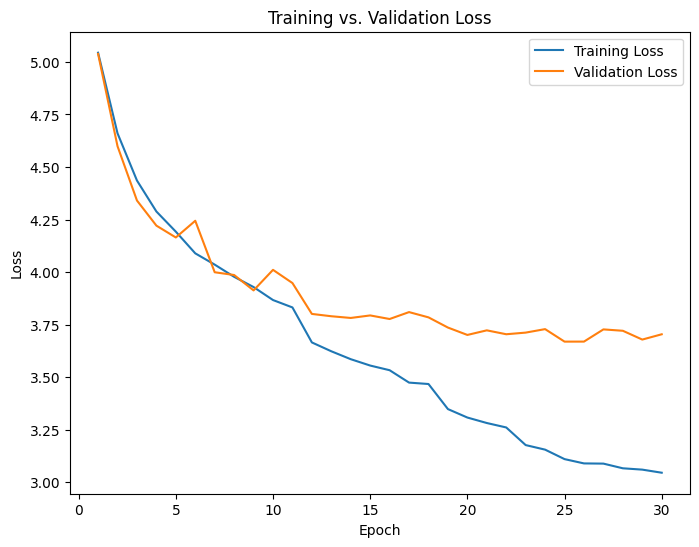

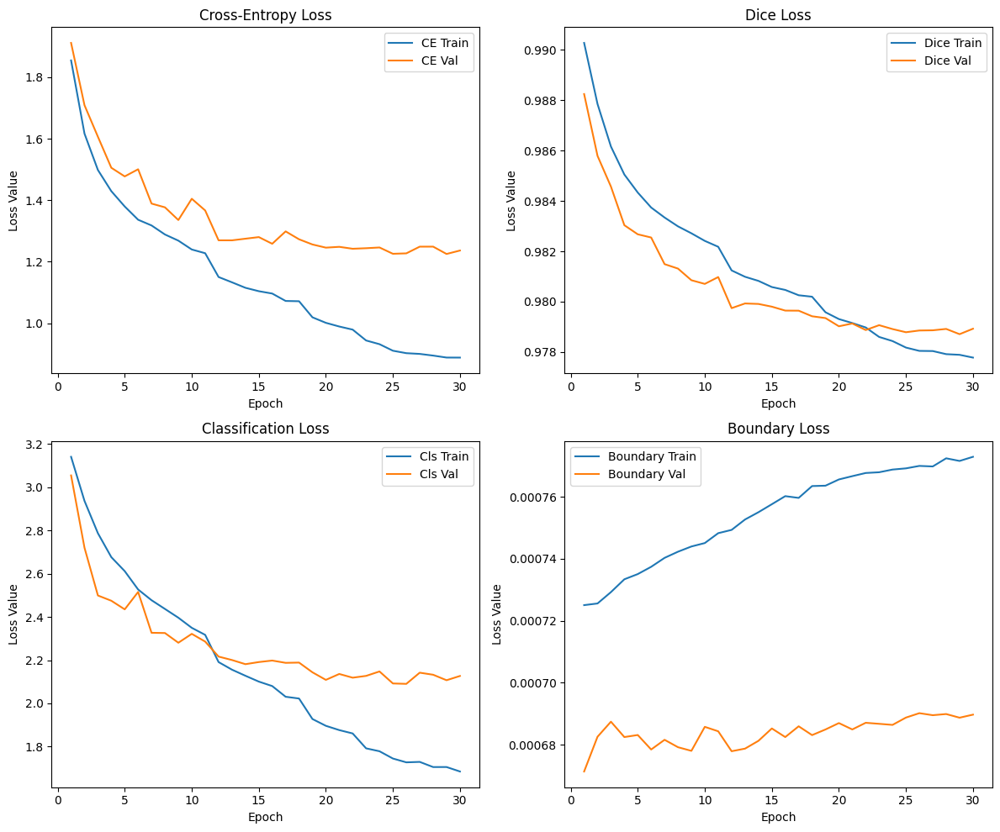

In [8]:
import os
import io
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
from tqdm import tqdm
from sklearn.model_selection import train_test_split
from skimage.measure import label, regionprops


# Hyperparameters (from Bayesian Optimization)
OPT_HYPERPARAMS = {
    "img_scale": 0.9208,
    "batch_size": 8,
    "num_epochs": 30,
    "learning_rate": 0.0012432,
    "weight_decay": 0.0001919,
    "num_workers": 1,
    "num_classes": 104,
    "use_amp": True,
    "flip_prob": 0.3935,
    "rotation_degrees": 18.69,
    "dice_weight": 1.0,
    "cls_loss_weight": 0.7,
    "unfreeze_frac": 0.2024,
    "boundary_loss_weight": 0.1577,
    "dropout_rate": 0.3,
    "color_jitter_brightness": 0.2,
    "color_jitter_contrast": 0.2,
    "color_jitter_saturation": 0.2,
    "color_jitter_hue": 0.1
}
base_size = 513
OPT_HYPERPARAMS["img_size"] = (
    int(round(base_size * OPT_HYPERPARAMS["img_scale"])),
    int(round(base_size * OPT_HYPERPARAMS["img_scale"]))
)

print("Using Hyperparameters:")
for key, value in OPT_HYPERPARAMS.items():
    print(f"  {key}: {value}")

# Helper Functions & Classes
def compute_metrics_from_confusion(conf_matrix):
    """Compute pixel accuracy, mean IoU, and mean Dice from a confusion matrix."""
    pixel_acc = np.trace(conf_matrix) / conf_matrix.sum() if conf_matrix.sum() > 0 else 0
    iou_list = []
    dice_list = []
    for i in range(conf_matrix.shape[0]):
        intersection = conf_matrix[i, i]
        union = conf_matrix[i, :].sum() + conf_matrix[:, i].sum() - conf_matrix[i, i]
        if union == 0:
            iou = np.nan
            dice = np.nan
        else:
            iou = intersection / union
            s = np.sum(conf_matrix[i, :]) + np.sum(conf_matrix[:, i])
            dice = np.nan if s == 0 else (2 * intersection) / (s + 1e-8)
        iou_list.append(iou)
        dice_list.append(dice)
    mean_iou = np.nanmean(iou_list)
    mean_dice = np.nanmean(dice_list)
    return pixel_acc, mean_iou, mean_dice

def dice_loss_fn(pred, target, smooth=1e-6):
    """Computes Dice loss."""
    pred = torch.softmax(pred, dim=1)
    target_one_hot = torch.nn.functional.one_hot(target, num_classes=pred.shape[1]) \
                           .permute(0, 3, 1, 2).float().to(pred.device)
    intersection = (pred * target_one_hot).sum(dim=(2, 3))
    union = pred.sum(dim=(2, 3)) + target_one_hot.sum(dim=(2, 3))
    dice = (2. * intersection + smooth) / (union + smooth)
    return 1 - dice.mean()

def classification_loss_fn(outputs, masks, num_classes):
    """
    Computes a KL divergence loss between the predicted global class distribution (ignoring background)
    and the target distribution derived from the mask.
    """
    p_pred = torch.softmax(outputs, dim=1).mean(dim=[2,3])
    p_pred = p_pred[:, 1:]  # Exclude background
    N = masks.size(0)
    target = torch.zeros((N, num_classes - 1), device=masks.device)
    masks_np = masks.cpu().numpy()
    for i in range(N):
        unique = np.unique(masks_np[i])
        for cls in unique:
            cls = int(cls)
            if cls > 0:
                target[i, cls - 1] = 1
        s = target[i].sum()
        if s > 0:
            target[i] /= s
    loss_cls = nn.functional.kl_div(p_pred.log(), target, reduction='batchmean')
    return loss_cls

    #    Computes boundary loss 
def boundary_loss_fn(pred, target):
    pred = torch.softmax(pred, dim=1)
    laplacian_kernel = torch.tensor([[0, 1, 0],
                                     [1, -4, 1],
                                     [0, 1, 0]], dtype=pred.dtype, device=pred.device).view(1, 1, 3, 3)
    boundaries_pred = []
    for c in range(pred.shape[1]):
        channel_pred = pred[:, c:c+1, :, :]
        boundary_c = torch.abs(torch.nn.functional.conv2d(channel_pred, laplacian_kernel, padding=1))
        boundaries_pred.append(boundary_c)
    boundaries_pred = torch.cat(boundaries_pred, dim=1)

    target_one_hot = torch.nn.functional.one_hot(target, num_classes=pred.shape[1]) \
                           .permute(0, 3, 1, 2).float().to(pred.device)
    boundaries_target = []
    for c in range(target_one_hot.shape[1]):
        channel_target = target_one_hot[:, c:c+1, :, :]
        boundary_c = torch.abs(torch.nn.functional.conv2d(channel_target, laplacian_kernel, padding=1))
        boundaries_target.append(boundary_c)
    boundaries_target = torch.cat(boundaries_target, dim=1)

    loss_boundary = torch.nn.functional.l1_loss(boundaries_pred, boundaries_target)
    return loss_boundary

class JointTransform:
    def __init__(self, flip_prob=0.5, rotation_degrees=0):
        self.flip_prob = flip_prob
        self.rotation_degrees = rotation_degrees

    def __call__(self, img, mask):
        if np.random.random() < self.flip_prob:
            img = transforms.functional.hflip(img)
            mask = transforms.functional.hflip(mask)
        if self.rotation_degrees:
            angle = np.random.uniform(-self.rotation_degrees, self.rotation_degrees)
            img = transforms.functional.rotate(img, angle, interpolation=Image.BILINEAR, expand=True)
            mask = transforms.functional.rotate(mask, angle, interpolation=Image.NEAREST, expand=True)
        return img, mask

class FoodSegDataset(Dataset):
    def __init__(self, dataframe, img_transform=None, mask_resize=None, joint_transform=None):
        self.df = dataframe
        self.img_transform = img_transform
        self.mask_resize = mask_resize
        self.joint_transform = joint_transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        image_dict = row['image']
        img = Image.open(io.BytesIO(image_dict.get("bytes"))).convert("RGB")
        label_dict = row['label']
        mask = Image.open(io.BytesIO(label_dict.get("bytes")))
        if self.joint_transform is not None:
            img, mask = self.joint_transform(img, mask)
        if self.mask_resize:
            mask = self.mask_resize(mask)
        if self.img_transform:
            img = self.img_transform(img)
        mask = torch.from_numpy(np.array(mask)).long()
        return img, mask




# Data Loading
class_mappings = pd.read_csv('/content/foodseg103/class_mappings.csv')
id_to_food = dict(zip(class_mappings["Class Id"], class_mappings["Class Name"]))

train_files = [
    '/content/foodseg103/train-00000-of-00003-6bb37ec387d1825a.parquet',
    '/content/foodseg103/train-00001-of-00003-4a1caa37147c0681.parquet',
    '/content/foodseg103/train-00002-of-00003-c8b698399244cd95.parquet'
]
train_dfs = [pd.read_parquet(f) for f in train_files]
full_train_df = pd.concat(train_dfs, ignore_index=True)
print("Full training data shape:", full_train_df.shape)

train_df, test_df = train_test_split(full_train_df, test_size=0.2, random_state=42)
print("Training set shape:", train_df.shape)
print("Testing set shape:", test_df.shape)


# Define Transforms and Datasets

# Training augmentation: random resized crop, color jitter, then normalization.
train_img_transform = transforms.Compose([
    transforms.RandomResizedCrop(OPT_HYPERPARAMS["img_size"][0], scale=(0.8, 1.0)),
    transforms.ColorJitter(
        brightness=OPT_HYPERPARAMS["color_jitter_brightness"],
        contrast=OPT_HYPERPARAMS["color_jitter_contrast"],
        saturation=OPT_HYPERPARAMS["color_jitter_saturation"],
        hue=OPT_HYPERPARAMS["color_jitter_hue"]
    ),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])
# Validation transformation: simple resize and normalize.
val_img_transform = transforms.Compose([
    transforms.Resize(OPT_HYPERPARAMS["img_size"]),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])
mask_resize = transforms.Resize(OPT_HYPERPARAMS["img_size"], interpolation=Image.NEAREST)

joint_transform = JointTransform(
    flip_prob=OPT_HYPERPARAMS["flip_prob"],
    rotation_degrees=OPT_HYPERPARAMS["rotation_degrees"]
)

train_dataset = FoodSegDataset(train_df, img_transform=train_img_transform,
                               mask_resize=mask_resize, joint_transform=joint_transform)
train_loader = DataLoader(train_dataset, batch_size=OPT_HYPERPARAMS["batch_size"],
                          shuffle=True, num_workers=OPT_HYPERPARAMS["num_workers"])

test_dataset = FoodSegDataset(test_df, img_transform=val_img_transform,
                              mask_resize=mask_resize, joint_transform=None)
test_loader = DataLoader(test_dataset, batch_size=OPT_HYPERPARAMS["batch_size"],
                         shuffle=False, num_workers=OPT_HYPERPARAMS["num_workers"])


# Build Model
model = torch.hub.load('pytorch/vision:v0.10.0', 'deeplabv3_resnet50', pretrained=True)
# Freeze the backbone initially.
for param in model.backbone.parameters():
    param.requires_grad = False
# Unfreeze a fraction of backbone layers.
unfreeze_frac = OPT_HYPERPARAMS["unfreeze_frac"]
children = list(model.backbone.children())
n_children = len(children)
n_unfreeze = int(unfreeze_frac * n_children)
print(f"Unfreezing last {n_unfreeze} layers out of {n_children} in backbone.")
if n_unfreeze > 0:
    for child in children[-n_unfreeze:]:
        for param in child.parameters():
            param.requires_grad = True

# Modify the classifier to insert dropout before the final layer.
if isinstance(model.classifier, nn.Sequential):
    classifier_layers = list(model.classifier.children())
    # Insert dropout layer using dropout_rate from hyperparameters.
    classifier_layers.insert(-1, nn.Dropout(OPT_HYPERPARAMS["dropout_rate"]))
    # Replace final layer with a new conv layer to output the correct number of classes.
    classifier_layers[-1] = nn.Conv2d(256, OPT_HYPERPARAMS["num_classes"], kernel_size=1)
    model.classifier = nn.Sequential(*classifier_layers)
else:
    model.classifier[4] = nn.Conv2d(256, OPT_HYPERPARAMS["num_classes"], kernel_size=1)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)


# Loss, Optimizer, Scheduler, and AMP Scaler
criterion_ce = nn.CrossEntropyLoss()
dice_weight = OPT_HYPERPARAMS["dice_weight"]
cls_loss_weight = OPT_HYPERPARAMS["cls_loss_weight"]
boundary_loss_weight = OPT_HYPERPARAMS["boundary_loss_weight"]

optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()),
                       lr=OPT_HYPERPARAMS["learning_rate"],
                       weight_decay=OPT_HYPERPARAMS["weight_decay"])
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=1, verbose=True)
scaler = torch.cuda.amp.GradScaler() if OPT_HYPERPARAMS["use_amp"] and device.type == 'cuda' else None


# Training and Validation Loop with Loss Logging
train_losses = []
val_losses = []
best_val_loss = float('inf')
model_save_path = "/content/foodseg103/best_deeplabv3_resnet50_foodseg103.pth"

# Logs for individual loss components
train_loss_ce_log = []
train_loss_dice_log = []
train_loss_cls_log = []
train_loss_bound_log = []

val_loss_ce_log = []
val_loss_dice_log = []
val_loss_cls_log = []
val_loss_bound_log = []

num_epochs = OPT_HYPERPARAMS["num_epochs"]

for epoch in range(num_epochs):
    model.train()
    train_loss_total = 0.0
    train_loss_ce_epoch = 0.0
    train_loss_dice_epoch = 0.0
    train_loss_cls_epoch = 0.0
    train_loss_bound_epoch = 0.0

    train_conf_matrix = np.zeros((OPT_HYPERPARAMS["num_classes"], OPT_HYPERPARAMS["num_classes"]), dtype=np.int64)
    train_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Training]")
    for images, masks in train_bar:
        images = images.to(device)
        masks = masks.to(device)
        optimizer.zero_grad()

        if scaler is not None:
            with torch.cuda.amp.autocast():
                outputs = model(images)['out']
                loss_ce_val = criterion_ce(outputs, masks)
                loss_dice_val = dice_loss_fn(outputs, masks)
                loss_cls_val = classification_loss_fn(outputs, masks, OPT_HYPERPARAMS["num_classes"])
                loss_bound_val = boundary_loss_fn(outputs, masks)
                loss = (loss_ce_val +
                        dice_weight * loss_dice_val +
                        cls_loss_weight * loss_cls_val +
                        boundary_loss_weight * loss_bound_val)
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
        else:
            outputs = model(images)['out']
            loss_ce_val = criterion_ce(outputs, masks)
            loss_dice_val = dice_loss_fn(outputs, masks)
            loss_cls_val = classification_loss_fn(outputs, masks, OPT_HYPERPARAMS["num_classes"])
            loss_bound_val = boundary_loss_fn(outputs, masks)
            loss = (loss_ce_val +
                    dice_weight * loss_dice_val +
                    cls_loss_weight * loss_cls_val +
                    boundary_loss_weight * loss_bound_val)
            loss.backward()
            optimizer.step()

        train_loss_total += loss.item()
        train_loss_ce_epoch += loss_ce_val.item()
        train_loss_dice_epoch += loss_dice_val.item()
        train_loss_cls_epoch += loss_cls_val.item()
        train_loss_bound_epoch += loss_bound_val.item()

        preds = outputs.argmax(dim=1).detach().cpu().numpy()
        targets = masks.detach().cpu().numpy()
        batch_conf = np.bincount(
            OPT_HYPERPARAMS["num_classes"] * targets.flatten() + preds.flatten(),
            minlength=OPT_HYPERPARAMS["num_classes"]**2
        ).reshape(OPT_HYPERPARAMS["num_classes"], OPT_HYPERPARAMS["num_classes"])
        train_conf_matrix += batch_conf

        train_bar.set_postfix(loss=f"{loss.item():.4f}")

    avg_train_loss = train_loss_total / len(train_loader)
    train_losses.append(avg_train_loss)
    train_loss_ce_log.append(train_loss_ce_epoch / len(train_loader))
    train_loss_dice_log.append(train_loss_dice_epoch / len(train_loader))
    train_loss_cls_log.append(train_loss_cls_epoch / len(train_loader))
    train_loss_bound_log.append(train_loss_bound_epoch / len(train_loader))

    train_pixel_acc, train_mean_iou, train_mean_dice = compute_metrics_from_confusion(train_conf_matrix)
    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {avg_train_loss:.4f}, "
          f"Pixel Acc: {train_pixel_acc:.4f}, mIoU: {train_mean_iou:.4f}, mDice: {train_mean_dice:.4f}")

    model.eval()
    test_loss_total = 0.0
    test_loss_ce_epoch = 0.0
    test_loss_dice_epoch = 0.0
    test_loss_cls_epoch = 0.0
    test_loss_bound_epoch = 0.0

    test_conf_matrix = np.zeros((OPT_HYPERPARAMS["num_classes"], OPT_HYPERPARAMS["num_classes"]), dtype=np.int64)
    with torch.no_grad():
        test_bar = tqdm(test_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Testing]")
        for images, masks in test_bar:
            images = images.to(device)
            masks = masks.to(device)
            outputs = model(images)['out']

            loss_ce_val = criterion_ce(outputs, masks)
            loss_dice_val = dice_loss_fn(outputs, masks)
            loss_cls_val = classification_loss_fn(outputs, masks, OPT_HYPERPARAMS["num_classes"])
            loss_bound_val = boundary_loss_fn(outputs, masks)
            loss = (loss_ce_val +
                    dice_weight * loss_dice_val +
                    cls_loss_weight * loss_cls_val +
                    boundary_loss_weight * loss_bound_val)
            test_loss_total += loss.item()
            test_loss_ce_epoch += loss_ce_val.item()
            test_loss_dice_epoch += loss_dice_val.item()
            test_loss_cls_epoch += loss_cls_val.item()
            test_loss_bound_epoch += loss_bound_val.item()

            preds = outputs.argmax(dim=1).detach().cpu().numpy()
            targets = masks.detach().cpu().numpy()
            batch_conf = np.bincount(
                OPT_HYPERPARAMS["num_classes"] * targets.flatten() + preds.flatten(),
                minlength=OPT_HYPERPARAMS["num_classes"]**2
            ).reshape(OPT_HYPERPARAMS["num_classes"], OPT_HYPERPARAMS["num_classes"])
            test_conf_matrix += batch_conf

            test_bar.set_postfix(loss=f"{loss.item():.4f}")

    avg_test_loss = test_loss_total / len(test_loader)
    val_losses.append(avg_test_loss)
    val_loss_ce_log.append(test_loss_ce_epoch / len(test_loader))
    val_loss_dice_log.append(test_loss_dice_epoch / len(test_loader))
    val_loss_cls_log.append(test_loss_cls_epoch / len(test_loader))
    val_loss_bound_log.append(test_loss_bound_epoch / len(test_loader))

    test_pixel_acc, test_mean_iou, test_mean_dice = compute_metrics_from_confusion(test_conf_matrix)
    print(f"Epoch [{epoch+1}/{num_epochs}], Test Loss: {avg_test_loss:.4f}, "
          f"Pixel Acc: {test_pixel_acc:.4f}, mIoU: {test_mean_iou:.4f}, mDice: {test_mean_dice:.4f}")

    scheduler.step(avg_test_loss)

    if avg_test_loss < best_val_loss:
        best_val_loss = avg_test_loss
        torch.save(model.state_dict(), model_save_path)
        print(f"New best model found and saved with Test Loss: {avg_test_loss:.4f}")


# Plot Overall Loss Curves
plt.figure(figsize=(8, 6))
plt.plot(range(1, num_epochs+1), train_losses, label="Training Loss")
plt.plot(range(1, num_epochs+1), val_losses, label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training vs. Validation Loss")
plt.legend()
plt.show()

# Plot Individual Loss Components
fig, axs = plt.subplots(2, 2, figsize=(12, 10))
axs[0, 0].plot(range(1, num_epochs+1), train_loss_ce_log, label="CE Train")
axs[0, 0].plot(range(1, num_epochs+1), val_loss_ce_log, label="CE Val")
axs[0, 0].set_title("Cross-Entropy Loss")

axs[0, 1].plot(range(1, num_epochs+1), train_loss_dice_log, label="Dice Train")
axs[0, 1].plot(range(1, num_epochs+1), val_loss_dice_log, label="Dice Val")
axs[0, 1].set_title("Dice Loss")

axs[1, 0].plot(range(1, num_epochs+1), train_loss_cls_log, label="Cls Train")
axs[1, 0].plot(range(1, num_epochs+1), val_loss_cls_log, label="Cls Val")
axs[1, 0].set_title("Classification Loss")

axs[1, 1].plot(range(1, num_epochs+1), train_loss_bound_log, label="Boundary Train")
axs[1, 1].plot(range(1, num_epochs+1), val_loss_bound_log, label="Boundary Val")
axs[1, 1].set_title("Boundary Loss")

for ax in axs.flat:
    ax.legend()
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss Value")
plt.tight_layout()
plt.show()

In [9]:
from google.colab import files
files.download("/content/foodseg103/best_deeplabv3_resnet50_foodseg103.pth")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

The main changes of this expierment happen here in the validation code. I have added post processing to help deal with the over prediction and over segmentting problems. This change shows very promising results, at the minute the post processing is too agressive and tends to merge items that should not be merged but I have chosen to leave that as is for now and to wait until we have a better performing model before refining the postprocessing

Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
<ipython-input-21-7cd6c5673b95>:47: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickl


Processing validation sample 1


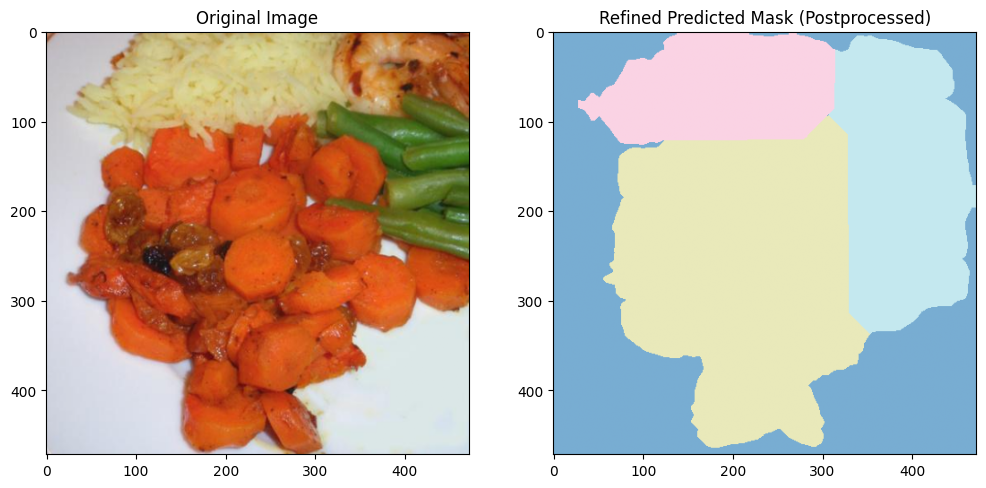

True food items:       ['French beans', 'rice', 'dried cranberries', 'carrot', 'shrimp']
Predicted food items:  ['French beans', 'rice', 'carrot']
Alternate guesses per region: {1: ('carrot', ['steak', 'chicken duck', 'rice', 'broccoli', 'green beans', 'French beans', 'white button mushroom']), 2: ('carrot', ['French beans']), 3: ('carrot', ['French beans']), 4: ('French beans', ['chicken duck', 'rice', 'carrot']), 5: ('rice', ['chicken duck', 'carrot'])}
Food Accuracy:        60.00%
Pixel Accuracy:       76.22%
Mean IoU:             43.58%
Mean Dice:            51.75%
Avg. Hausdorff Dist.: 94.43 pixels

Processing validation sample 2


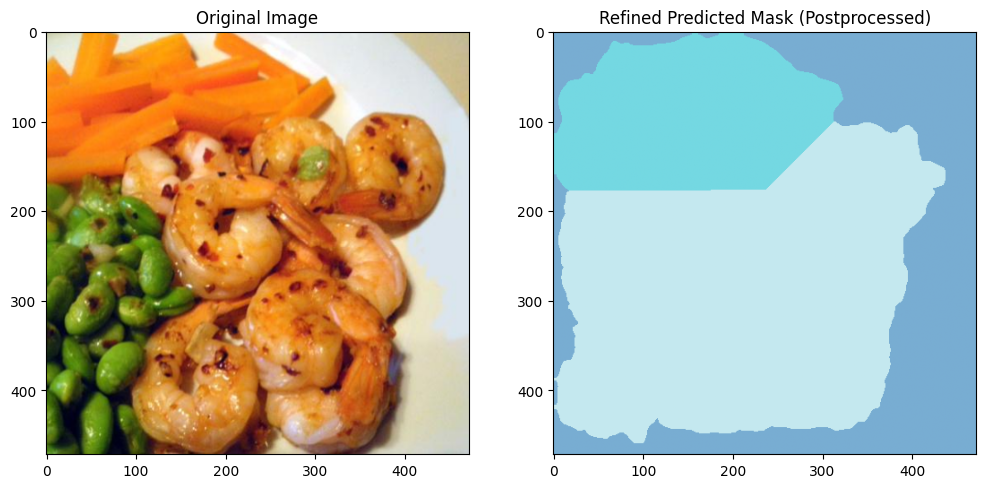

True food items:       ['shrimp', 'carrot', 'green beans']
Predicted food items:  ['carrot', 'onion']
Alternate guesses per region: {1: ('onion', ['chicken duck', 'shrimp', 'potato', 'cauliflower', 'tomato', 'cucumber', 'carrot', 'broccoli', 'cabbage', 'green beans', 'French beans', 'white button mushroom']), 2: ('carrot', ['shrimp', 'potato', 'cauliflower', 'broccoli', 'onion']), 3: ('carrot', ['shrimp', 'potato', 'cauliflower', 'onion'])}
Food Accuracy:        25.00%
Pixel Accuracy:       35.20%
Mean IoU:             26.77%
Mean Dice:            32.07%
Avg. Hausdorff Dist.: 57.49 pixels

Processing validation sample 3


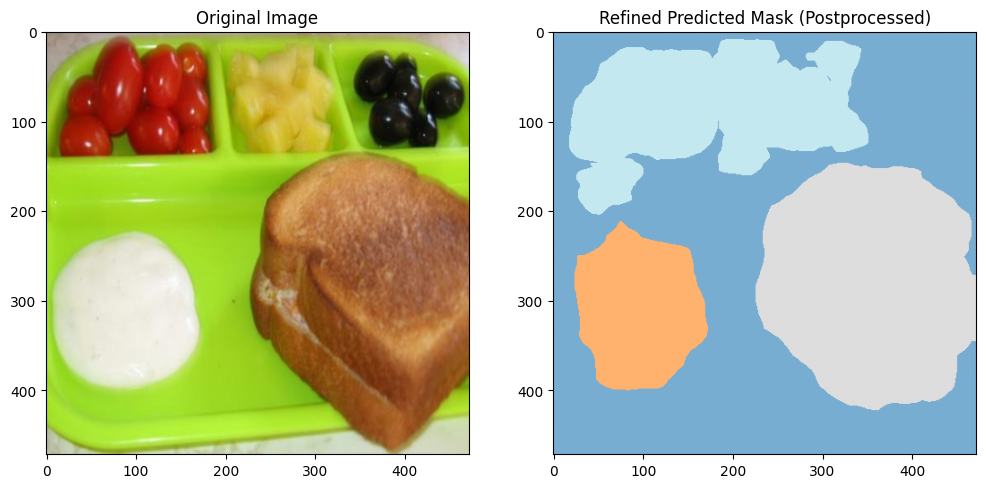

True food items:       ['olives', 'pineapple', 'tomato', 'sauce', 'bread']
Predicted food items:  ['ice cream', 'tomato', 'bread']
Alternate guesses per region: {1: ('bread', ['sauce']), 3: ('ice cream', ['egg']), 4: ('tomato', ['pasta', 'lettuce', 'carrot', 'celery stick', 'pepper']), 5: ('tomato', ['celery stick', 'pepper'])}
Food Accuracy:        33.33%
Pixel Accuracy:       68.77%
Mean IoU:             27.54%
Mean Dice:            32.85%
Avg. Hausdorff Dist.: 110.12 pixels

Processing validation sample 4


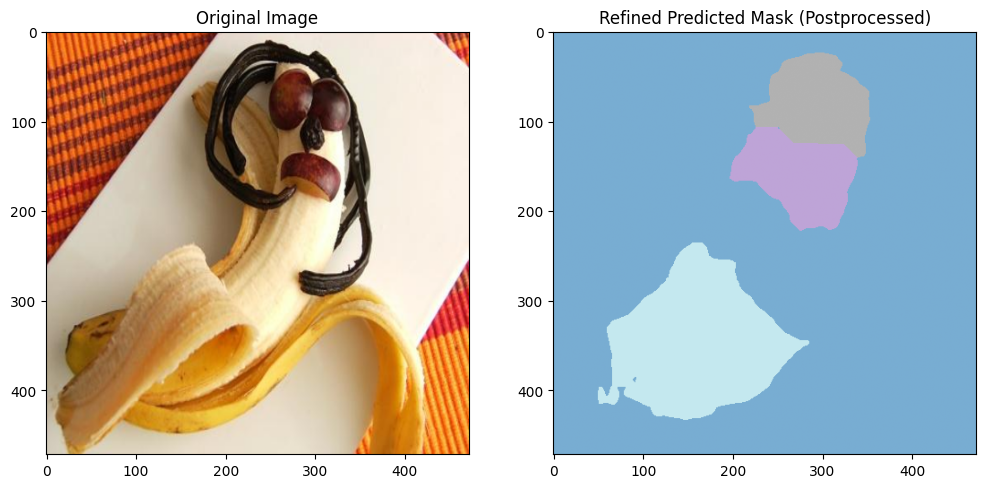

True food items:       ['grape', 'chocolate', 'banana']
Predicted food items:  ['apple', 'bread', 'grape']
Alternate guesses per region: {1: ('bread', ['biscuit', 'lemon']), 2: ('apple', ['almond', 'grape']), 3: ('grape', ['apple'])}
Food Accuracy:        20.00%
Pixel Accuracy:       60.29%
Mean IoU:             18.55%
Mean Dice:            23.31%
Avg. Hausdorff Dist.: 59.55 pixels

Processing validation sample 5


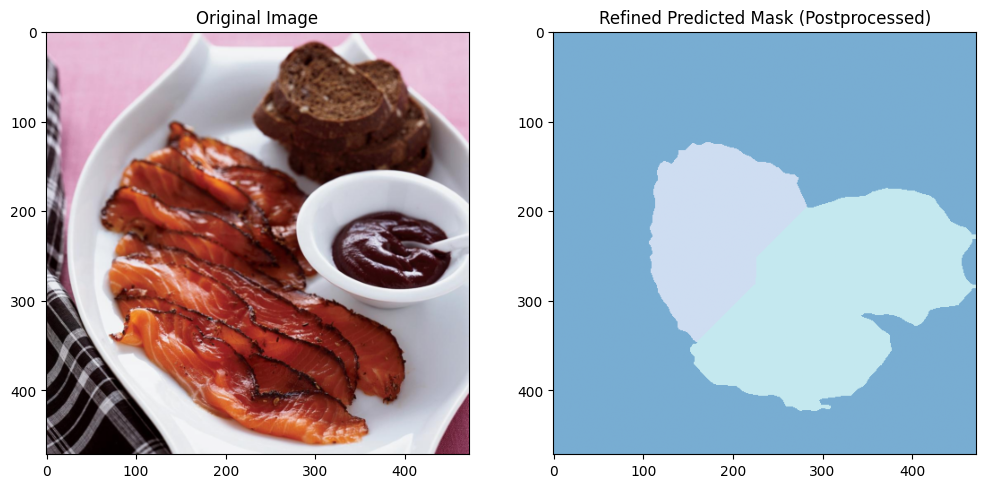

True food items:       ['bread', 'sauce', 'fish']
Predicted food items:  ['french fries', 'sauce']
Alternate guesses per region: {1: ('sauce', ['steak', 'pork', 'sausage', 'carrot']), 2: ('french fries', ['pork', 'sauce', 'carrot']), 3: ('french fries', ['sausage', 'sauce'])}
Food Accuracy:        25.00%
Pixel Accuracy:       51.86%
Mean IoU:             16.78%
Mean Dice:            22.13%
Avg. Hausdorff Dist.: 198.59 pixels

Processing validation sample 6


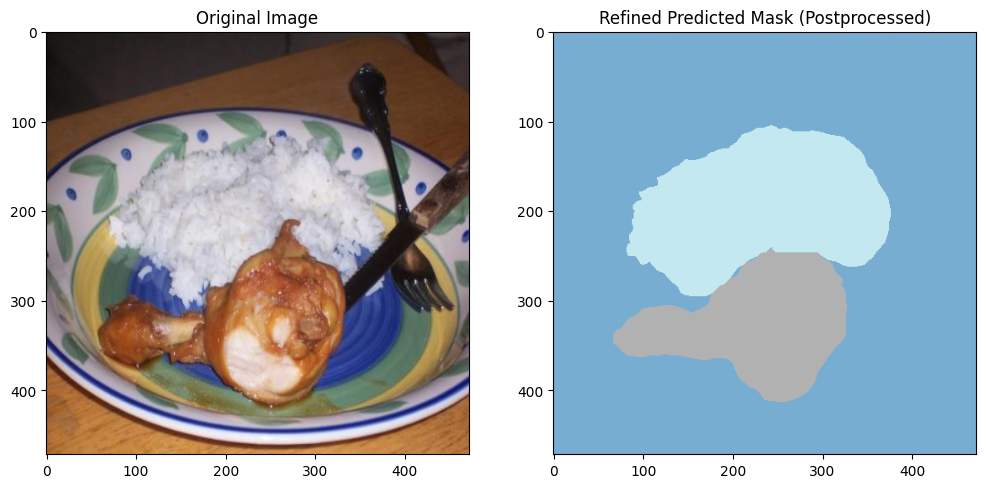

True food items:       ['chicken duck', 'rice']
Predicted food items:  ['chicken duck', 'rice']
Alternate guesses per region: {1: ('rice', ['steak', 'potato']), 2: ('chicken duck', ['steak', 'pork', 'sausage', 'rice'])}
Food Accuracy:        100.00%
Pixel Accuracy:       94.88%
Mean IoU:             85.76%
Mean Dice:            92.23%
Avg. Hausdorff Dist.: 30.01 pixels

Processing validation sample 7


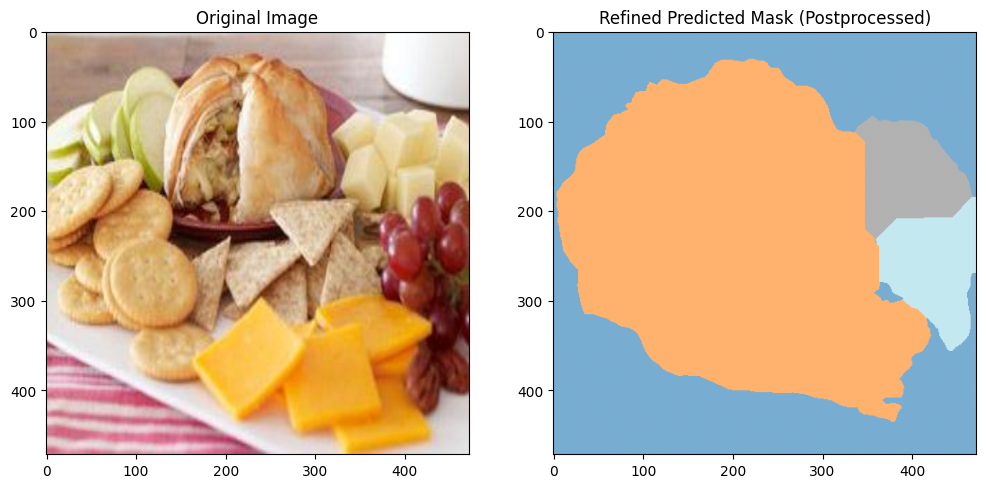

True food items:       ['biscuit', 'other ingredients', 'cheese butter', 'grape', 'apple', 'bread']
Predicted food items:  ['grape', 'biscuit', 'banana']
Alternate guesses per region: {1: ('biscuit', ['almond', 'apple', 'banana', 'grape', 'bread']), 3: ('banana', ['biscuit', 'apple', 'grape', 'celery stick']), 4: ('biscuit', ['carrot']), 5: ('biscuit', ['grape', 'carrot']), 6: ('grape', ['biscuit', 'apple'])}
Food Accuracy:        28.57%
Pixel Accuracy:       53.42%
Mean IoU:             20.51%
Mean Dice:            26.31%
Avg. Hausdorff Dist.: 116.32 pixels

Processing validation sample 8


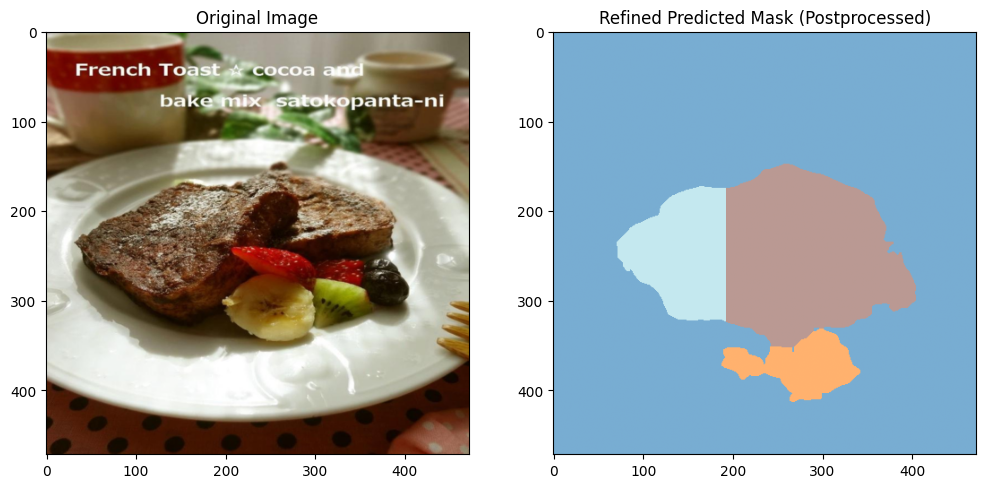

True food items:       ['blueberry', 'kiwi', 'bread', 'banana', 'strawberry']
Predicted food items:  ['ice cream', 'bread', 'strawberry']
Alternate guesses per region: {1: ('strawberry', ['ice cream', 'cake', 'cherry', 'blueberry', 'raspberry', 'kiwi', 'bread']), 2: ('bread', ['cake', 'strawberry', 'steak', 'pie']), 3: ('bread', ['cake', 'strawberry'])}
Food Accuracy:        33.33%
Pixel Accuracy:       82.06%
Mean IoU:             20.39%
Mean Dice:            24.72%
Avg. Hausdorff Dist.: 146.71 pixels

Processing validation sample 9


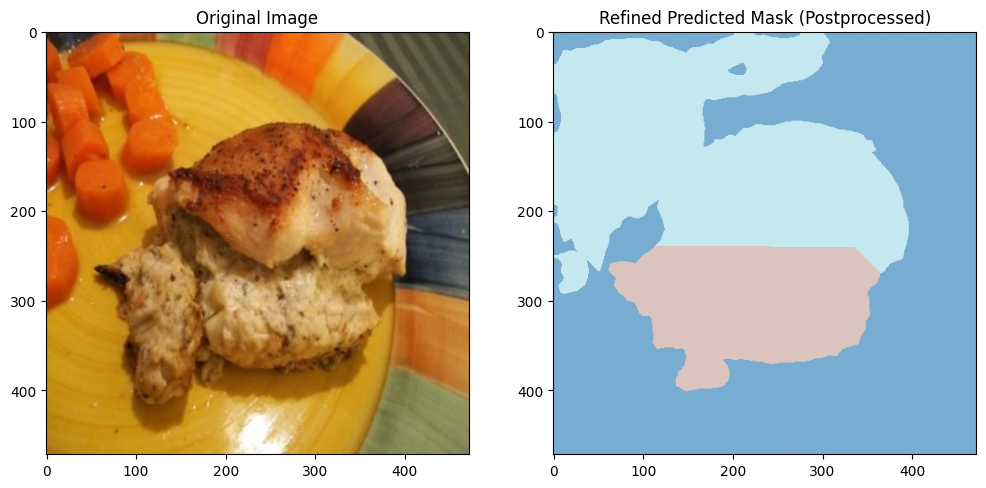

True food items:       ['chicken duck', 'carrot']
Predicted food items:  ['chicken duck', 'carrot']
Alternate guesses per region: {1: ('carrot', ['steak', 'pork', 'chicken duck', 'potato', 'tomato']), 2: ('chicken duck', ['steak', 'potato'])}
Food Accuracy:        100.00%
Pixel Accuracy:       71.39%
Mean IoU:             49.84%
Mean Dice:            64.18%
Avg. Hausdorff Dist.: 205.51 pixels

Processing validation sample 10


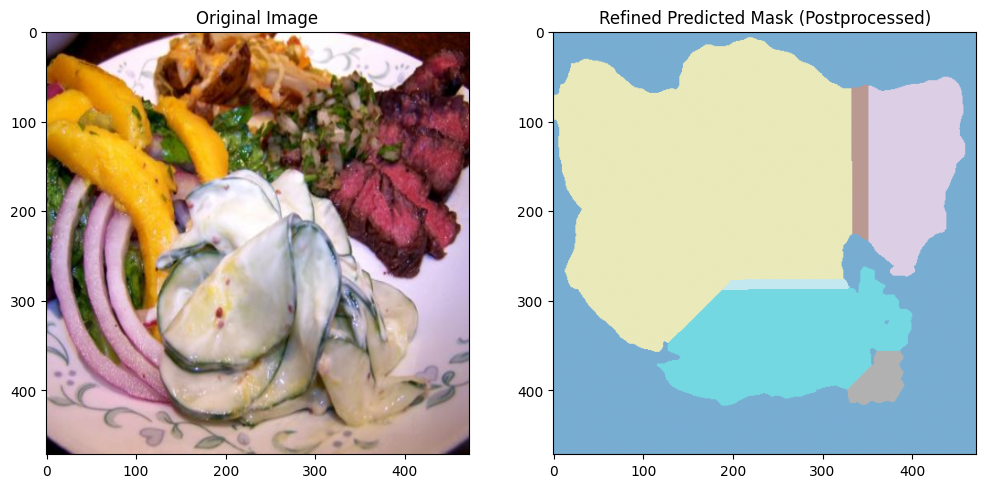

True food items:       ['shiitake', 'other ingredients', 'steak', 'cucumber', 'cilantro mint', 'onion']
Predicted food items:  ['shiitake', 'garlic', 'steak', 'lamb', 'carrot', 'onion']
Alternate guesses per region: {1: ('carrot', ['steak', 'lamb', 'potato', 'garlic', 'asparagus', 'broccoli', 'cabbage', 'onion', 'pepper', 'French beans', 'shiitake']), 2: ('shiitake', ['potato', 'garlic', 'onion']), 3: ('onion', ['potato', 'garlic', 'cucumber', 'cabbage', 'shiitake']), 4: ('steak', ['lamb', 'shiitake']), 5: ('lamb', ['steak', 'shiitake']), 6: ('garlic', ['cabbage', 'onion', 'shiitake'])}
Food Accuracy:        33.33%
Pixel Accuracy:       31.80%
Mean IoU:             12.52%
Mean Dice:            15.43%
Avg. Hausdorff Dist.: 211.15 pixels

Processing validation sample 11


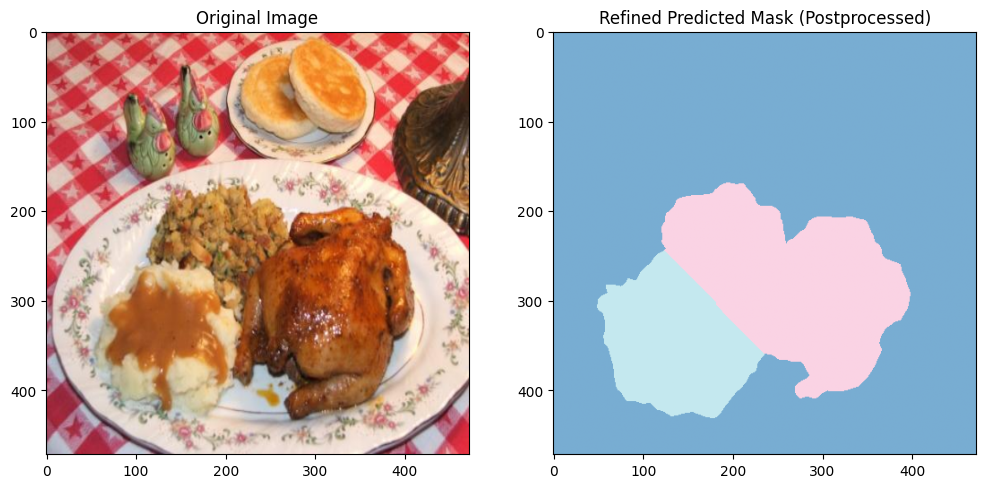

True food items:       ['chicken duck', 'pie', 'potato']
Predicted food items:  ['chicken duck', 'potato']
Alternate guesses per region: {2: ('chicken duck', ['steak', 'corn', 'pasta', 'rice', 'potato', 'cauliflower', 'green beans', 'French beans'])}
Food Accuracy:        66.67%
Pixel Accuracy:       88.30%
Mean IoU:             60.44%
Mean Dice:            66.89%
Avg. Hausdorff Dist.: 33.22 pixels

Processing validation sample 12


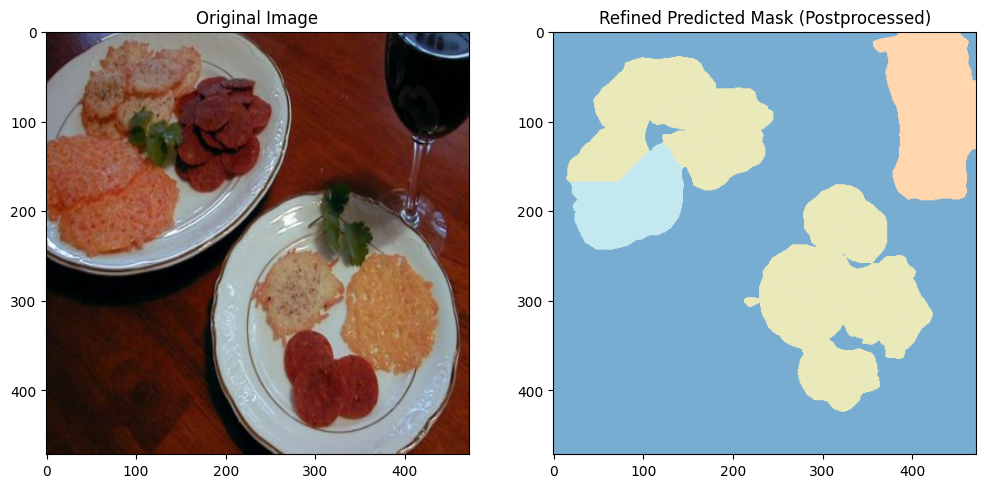

True food items:       ['wine', 'sausage', 'pie', 'cilantro mint']
Predicted food items:  ['wine', 'bread', 'pie']
Alternate guesses per region: {1: ('pie', ['bread', 'lettuce', 'cucumber']), 2: ('bread', ['ice cream', 'strawberry', 'cherry', 'orange', 'sausage', 'fried meat', 'sauce', 'pie', 'lettuce', 'cilantro mint']), 4: ('bread', ['pork', 'sausage', 'pie', 'lettuce', 'cucumber'])}
Food Accuracy:        40.00%
Pixel Accuracy:       67.61%
Mean IoU:             26.42%
Mean Dice:            32.63%
Avg. Hausdorff Dist.: 199.80 pixels

Processing validation sample 13


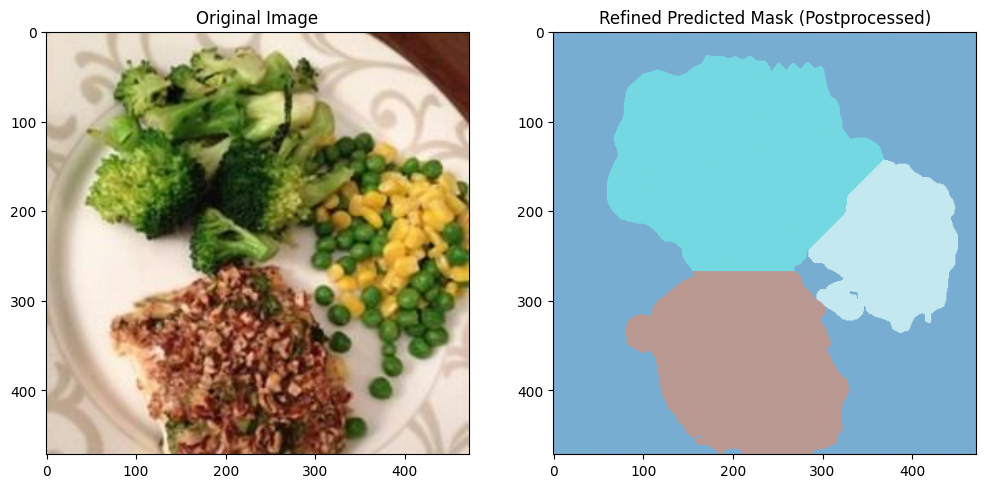

True food items:       ['corn', 'green beans', 'fish', 'broccoli']
Predicted food items:  ['chicken duck', 'broccoli', 'green beans']
Alternate guesses per region: {1: ('broccoli', ['chicken duck', 'corn', 'pasta', 'rice', 'green beans']), 3: ('chicken duck', ['rice', 'broccoli']), 4: ('green beans', ['soy', 'corn', 'pasta', 'rice', 'broccoli'])}
Food Accuracy:        40.00%
Pixel Accuracy:       66.28%
Mean IoU:             32.33%
Mean Dice:            37.83%
Avg. Hausdorff Dist.: 52.34 pixels

Processing validation sample 14


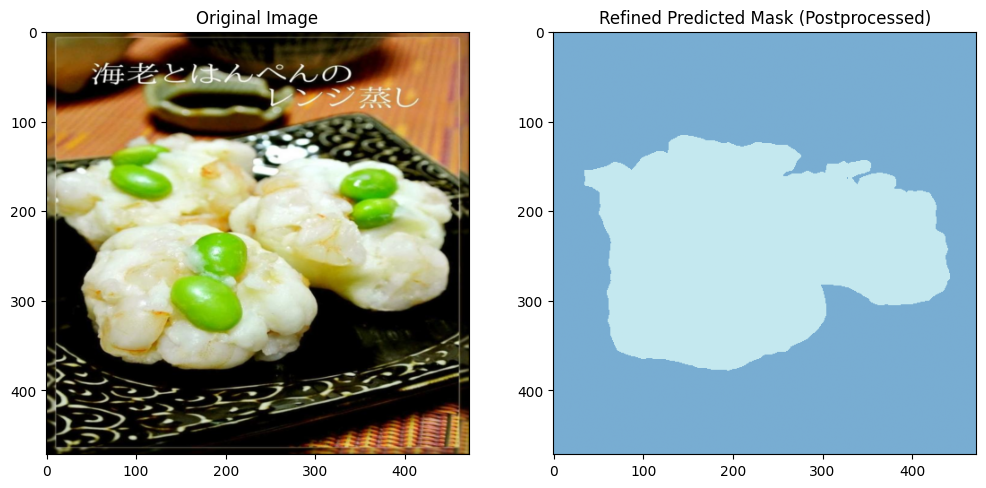

True food items:       ['shrimp', 'green beans']
Predicted food items:  ['shrimp']
Alternate guesses per region: {1: ('shrimp', ['candy', 'popcorn', 'egg', 'grape', 'potato', 'cauliflower', 'spring onion']), 2: ('shrimp', ['candy', 'popcorn', 'lemon', 'grape', 'corn', 'potato', 'cauliflower', 'spring onion'])}
Food Accuracy:        50.00%
Pixel Accuracy:       88.72%
Mean IoU:             54.26%
Mean Dice:            59.62%
Avg. Hausdorff Dist.: 50.16 pixels

Processing validation sample 15


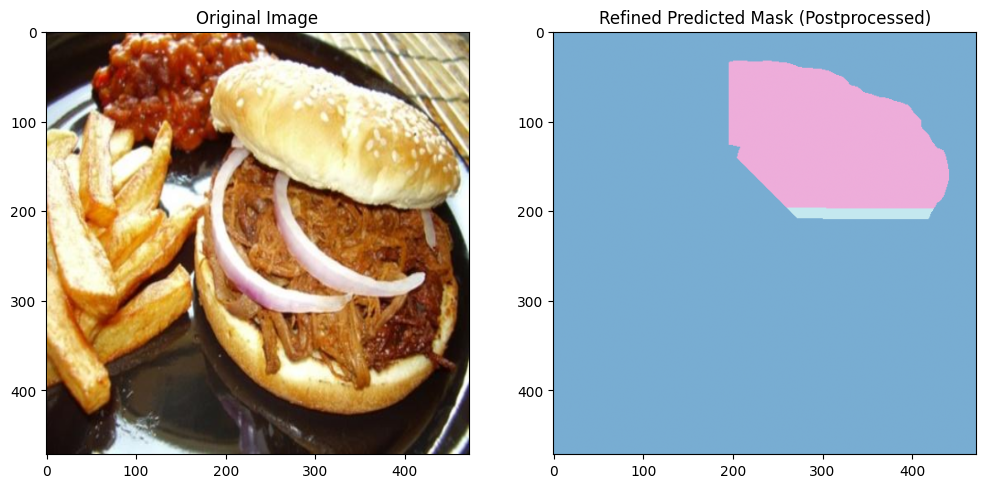

True food items:       ['french fries', 'steak', 'sauce', 'bread', 'onion']
Predicted food items:  ['bread', 'french fries', 'onion']
Alternate guesses per region: {1: ('french fries', ['soy', 'steak', 'sauce', 'bread', 'corn', 'onion']), 2: ('onion', ['steak', 'bread']), 3: ('bread', ['steak', 'onion']), 4: ('bread', ['steak', 'onion']), 5: ('bread', ['steak', 'sauce', 'corn', 'onion'])}
Food Accuracy:        60.00%
Pixel Accuracy:       56.68%
Mean IoU:             25.96%
Mean Dice:            33.73%
Avg. Hausdorff Dist.: 203.58 pixels

Processing validation sample 16


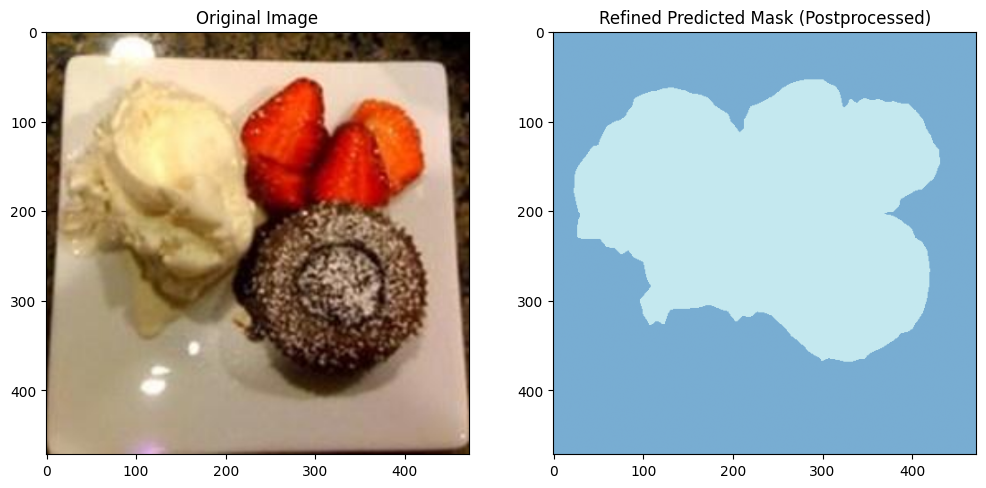

True food items:       ['ice cream', 'cake', 'strawberry']
Predicted food items:  ['cake']
Alternate guesses per region: {1: ('cake', ['strawberry', 'fried meat', 'rice']), 2: ('cake', ['ice cream', 'strawberry', 'bread']), 3: ('cake', ['ice cream', 'bread', 'potato'])}
Food Accuracy:        33.33%
Pixel Accuracy:       67.26%
Mean IoU:             29.89%
Mean Dice:            35.09%
Avg. Hausdorff Dist.: 212.66 pixels

Processing validation sample 17


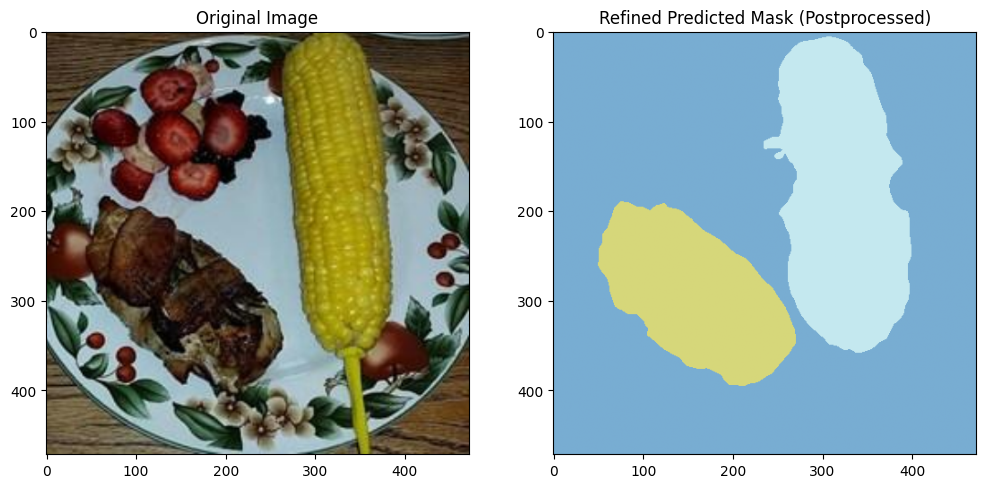

True food items:       ['raspberry', 'pork', 'chicken duck', 'corn', 'banana', 'strawberry']
Predicted food items:  ['chicken duck', 'corn']
Alternate guesses per region: {3: ('chicken duck', ['sausage', 'bread'])}
Food Accuracy:        33.33%
Pixel Accuracy:       80.86%
Mean IoU:             30.02%
Mean Dice:            34.82%
Avg. Hausdorff Dist.: 35.50 pixels

Processing validation sample 18


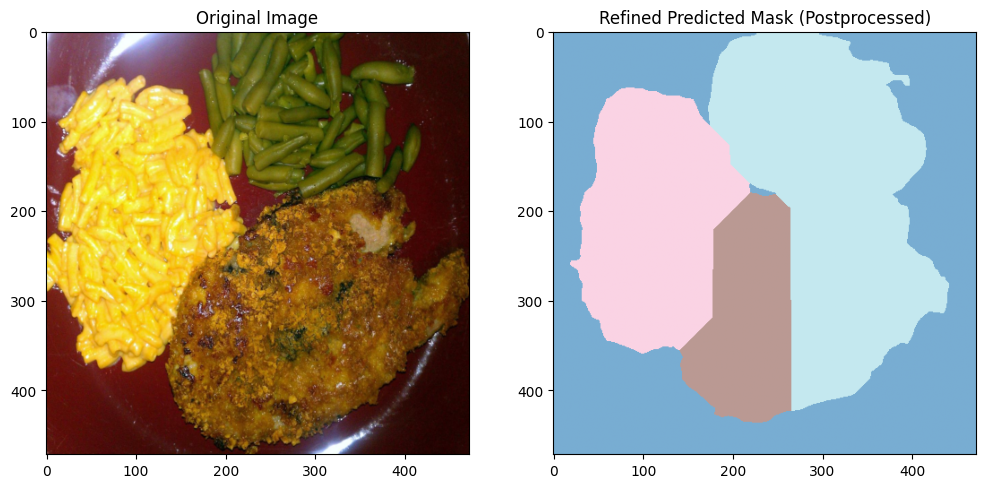

True food items:       ['pasta', 'French beans', 'pork']
Predicted food items:  ['chicken duck', 'noodles', 'French beans']
Alternate guesses per region: {1: ('chicken duck', ['noodles']), 2: ('French beans', ['chicken duck', 'noodles', 'broccoli']), 3: ('noodles', ['chicken duck', 'pasta', 'rice', 'French beans'])}
Food Accuracy:        20.00%
Pixel Accuracy:       45.83%
Mean IoU:             19.85%
Mean Dice:            24.65%
Avg. Hausdorff Dist.: 237.36 pixels

Processing validation sample 19


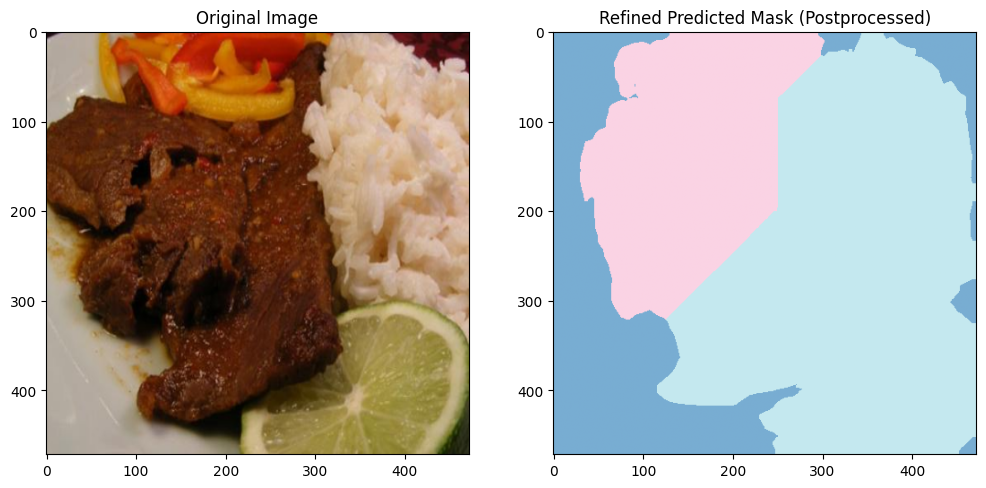

True food items:       ['chicken duck', 'rice', 'lemon', 'pepper']
Predicted food items:  ['rice', 'steak']
Alternate guesses per region: {1: ('rice', ['lemon', 'steak', 'pork', 'chicken duck', 'potato', 'cauliflower', 'carrot', 'broccoli']), 2: ('steak', ['carrot']), 3: ('steak', ['carrot']), 4: ('steak', ['pork', 'chicken duck', 'rice', 'tomato', 'carrot', 'broccoli', 'onion'])}
Food Accuracy:        20.00%
Pixel Accuracy:       34.95%
Mean IoU:             16.90%
Mean Dice:            22.09%
Avg. Hausdorff Dist.: 235.54 pixels

Processing validation sample 20


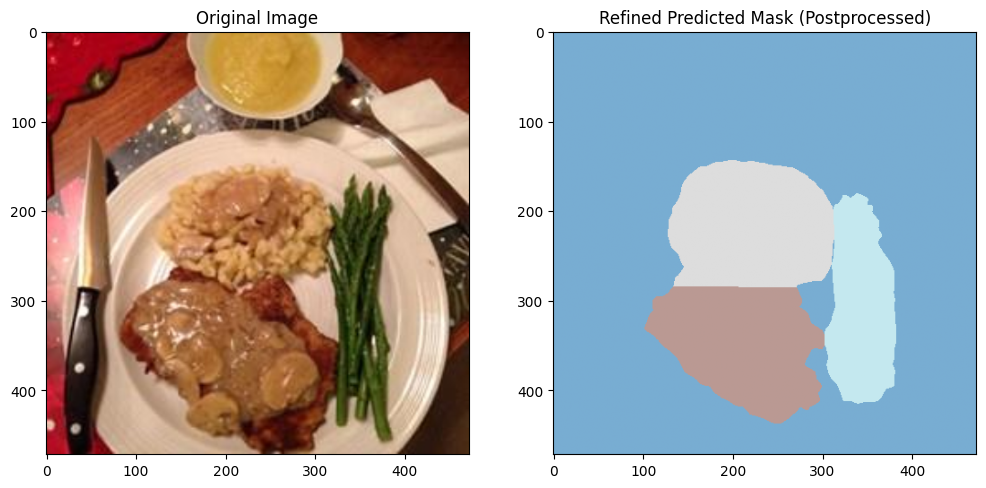

True food items:       ['white button mushroom', 'steak', 'sauce', 'asparagus', 'egg']
Predicted food items:  ['rice', 'asparagus', 'steak']
Alternate guesses per region: {1: ('rice', ['steak']), 2: ('steak', ['pork', 'sauce', 'rice']), 3: ('rice', ['steak']), 4: ('rice', ['steak', 'sauce']), 5: ('asparagus', ['steak', 'rice', 'rape', 'cilantro mint', 'French beans'])}
Food Accuracy:        33.33%
Pixel Accuracy:       75.68%
Mean IoU:             29.25%
Mean Dice:            34.57%
Avg. Hausdorff Dist.: 45.65 pixels

Processing validation sample 21


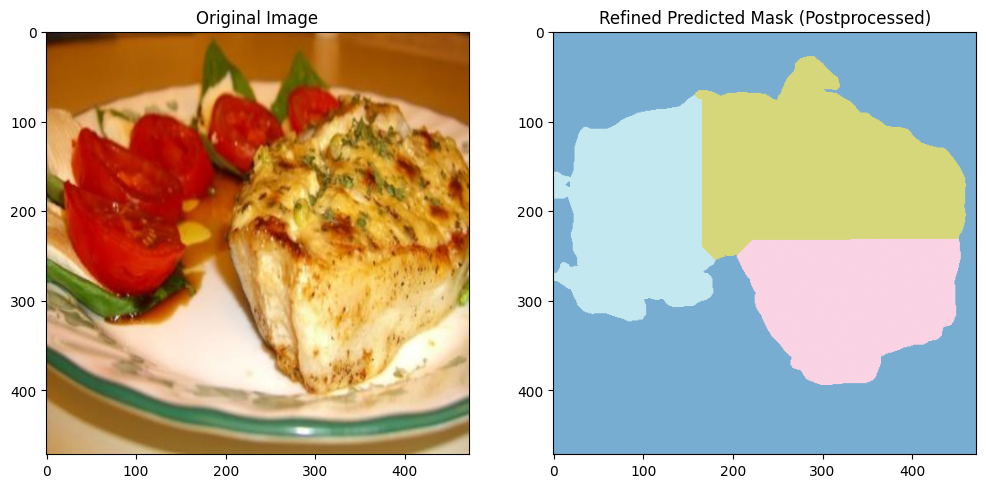

True food items:       ['tomato', 'cheese butter', 'fish', 'cilantro mint']
Predicted food items:  ['chicken duck', 'tomato', 'pizza']
Alternate guesses per region: {1: ('pizza', ['strawberry', 'chicken duck', 'pie', 'tomato', 'carrot', 'cilantro mint']), 2: ('chicken duck', ['pizza', 'pie']), 3: ('tomato', ['lettuce', 'carrot', 'cilantro mint']), 4: ('tomato', ['carrot'])}
Food Accuracy:        16.67%
Pixel Accuracy:       55.59%
Mean IoU:             19.73%
Mean Dice:            23.16%
Avg. Hausdorff Dist.: 159.00 pixels

Processing validation sample 22


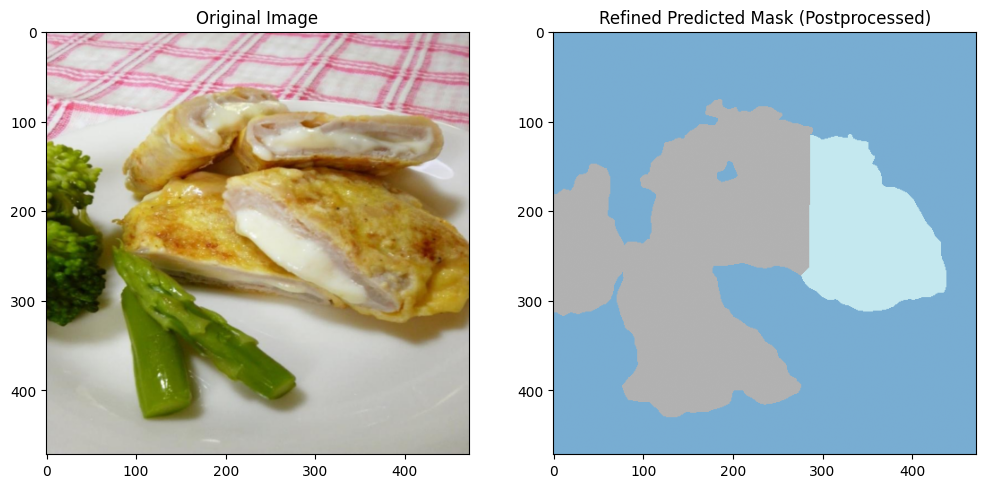

True food items:       ['chicken duck', 'asparagus', 'broccoli']
Predicted food items:  ['chicken duck', 'pie']
Alternate guesses per region: {1: ('pie', ['chicken duck', 'fish', 'shrimp', 'bread', 'onion']), 2: ('chicken duck', ['shrimp', 'pie', 'onion']), 3: ('chicken duck', ['fish', 'shrimp', 'bread', 'pie', 'tofu', 'potato', 'lettuce', 'asparagus', 'broccoli', 'celery stick', 'snow peas', 'onion', 'French beans'])}
Food Accuracy:        25.00%
Pixel Accuracy:       64.16%
Mean IoU:             21.10%
Mean Dice:            26.18%
Avg. Hausdorff Dist.: 189.64 pixels

Processing validation sample 23


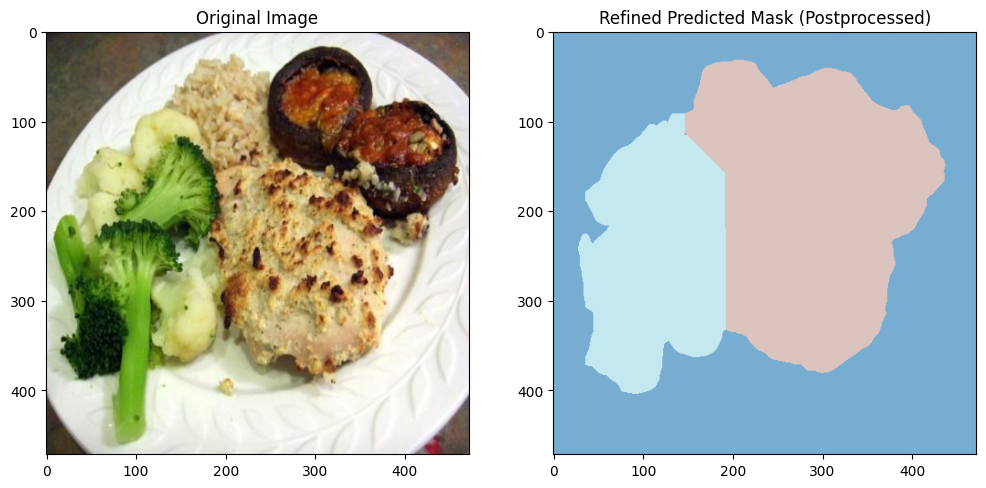

True food items:       ['rice', 'shiitake', 'cauliflower', 'chicken duck', 'broccoli']
Predicted food items:  ['chicken duck', 'broccoli']
Alternate guesses per region: {1: ('chicken duck', ['potato', 'broccoli']), 2: ('chicken duck', ['rice', 'potato', 'broccoli']), 3: ('broccoli', ['chicken duck', 'potato', 'cauliflower']), 4: ('broccoli', ['potato', 'cauliflower'])}
Food Accuracy:        40.00%
Pixel Accuracy:       72.65%
Mean IoU:             32.01%
Mean Dice:            38.63%
Avg. Hausdorff Dist.: 87.35 pixels

Processing validation sample 24


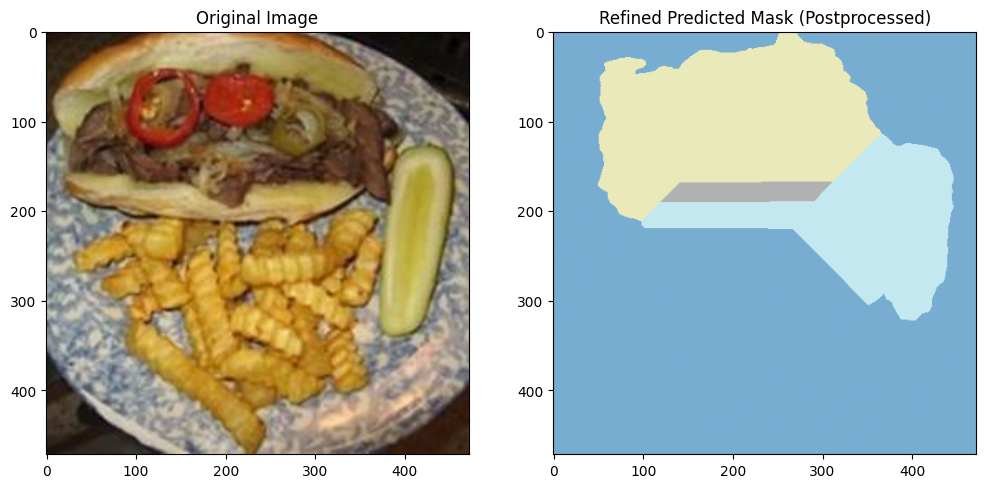

True food items:       ['french fries', 'tomato', 'steak', 'cucumber', 'bread', 'onion', 'pepper']
Predicted food items:  ['tomato', 'cucumber', 'french fries', 'bread']
Alternate guesses per region: {1: ('cucumber', ['french fries', 'steak', 'bread', 'lettuce', 'onion']), 2: ('bread', ['french fries', 'steak', 'onion']), 3: ('bread', ['steak', 'onion']), 5: ('tomato', ['steak', 'bread', 'lettuce', 'onion']), 7: ('french fries', ['corn'])}
Food Accuracy:        57.14%
Pixel Accuracy:       62.62%
Mean IoU:             25.15%
Mean Dice:            31.82%
Avg. Hausdorff Dist.: 173.96 pixels

Processing validation sample 25


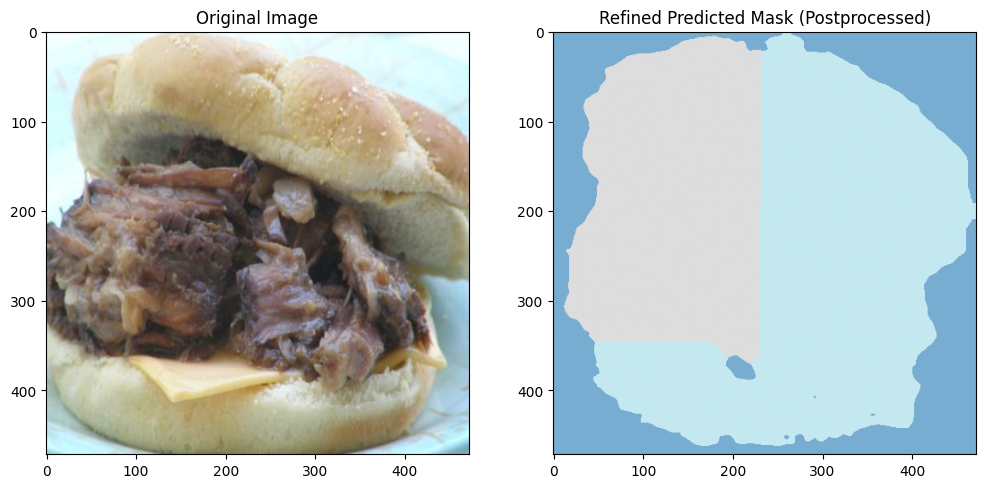

True food items:       ['cheese butter', 'bread', 'pork']
Predicted food items:  ['bread', 'steak']
Alternate guesses per region: {1: ('bread', ['french fries', 'steak', 'potato', 'cucumber', 'onion', 'white button mushroom']), 2: ('steak', ['pork', 'bread', 'potato', 'white button mushroom']), 3: ('bread', ['french fries', 'cheese butter', 'steak', 'potato', 'cucumber'])}
Food Accuracy:        25.00%
Pixel Accuracy:       40.23%
Mean IoU:             19.37%
Mean Dice:            25.91%
Avg. Hausdorff Dist.: 203.00 pixels

Overall Validation Performance Metrics (averaged over 25 samples):
Avg. Food Accuracy:   40.76%
Avg. Pixel Accuracy:  63.73%
Avg. Mean IoU:        30.60%
Avg. Mean Dice:       36.50%
Avg. Hausdorff Dist.: 133.95 pixels


In [21]:
import numpy as np
import pandas as pd
import io
import matplotlib.pyplot as plt
from PIL import Image
import torch
from torchvision import transforms
from matplotlib.colors import ListedColormap
import torch.nn as nn
from pyarrow.parquet import ParquetFile
from scipy.spatial.distance import directed_hausdorff
from skimage.measure import label, regionprops
import cv2
from scipy.ndimage import distance_transform_edt
from skimage.segmentation import watershed
from skimage.morphology import remove_small_objects, remove_small_holes

# Hyperparameters (using training settings)
BASE_SIZE = 513
TRAIN_IMG_SCALE = 0.9208  # same scale used during training
EVAL_IMG_SIZE = (int(round(BASE_SIZE * TRAIN_IMG_SCALE)),
                 int(round(BASE_SIZE * TRAIN_IMG_SCALE)))
NUM_CLASSES = 104

# Load class mappings
class_mappings = pd.read_csv('/content/foodseg103/class_mappings.csv')
id_to_food = dict(zip(class_mappings["Class Id"], class_mappings["Class Name"]))

# Model Loading (replicating training modifications)
def load_model():
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = torch.hub.load('pytorch/vision:v0.10.0', 'deeplabv3_resnet50', pretrained=True)
    # Replicate classifier modifications: add dropout and adjust final conv layer.
    if isinstance(model.classifier, nn.Sequential):
        classifier_layers = list(model.classifier.children())
        classifier_layers.insert(-1, nn.Dropout(0.3))  # using dropout_rate=0.3 from training
        classifier_layers[-1] = nn.Conv2d(256, NUM_CLASSES, kernel_size=1)
        model.classifier = nn.Sequential(*classifier_layers)
    else:
        model.classifier[4] = nn.Conv2d(256, NUM_CLASSES, kernel_size=1)
    state_dict = torch.load("/content/foodseg103/best_deeplabv3_resnet50_foodseg103.pth", map_location=device)
    model.load_state_dict(state_dict, strict=False)
    model.to(device)
    model.eval()
    return model, device


# Postprocessing Function: Per-Class Connected Components
from skimage.feature import peak_local_max

def postprocess_food_segmentation(mask, target_count=None, min_distance=10, footprint_size=3, centroid_tol=5):
   # Creates a binary mask (food vs. background)
    binary_mask = (mask > 0).astype(np.uint8)

    # A very light morphological opening can help remove tiny noise
    kernel = np.ones((3, 3), np.uint8)
    binary_mask = cv2.morphologyEx(binary_mask, cv2.MORPH_OPEN, kernel)

    # Computes distance transform on the binary mask
    dist_transform = distance_transform_edt(binary_mask)

    # Detect local peaks in the distance transform to serve as instance markers.
    # If no peaks are found, we will later fallback to connected components.
    coordinates = peak_local_max(
        dist_transform,
        min_distance=min_distance,
        footprint=np.ones((footprint_size, footprint_size)),
        labels=binary_mask
    )

    # If a target instance count is given, adjust the markers:
    if target_count is not None:
        # If too many markers, keep the top ones (those with highest distance values)
        if len(coordinates) > target_count:
            intensities = [dist_transform[tuple(coord)] for coord in coordinates]
            sorted_idx = np.argsort(intensities)[::-1]  # descending order
            coordinates = coordinates[sorted_idx][:target_count]
        # If too few markers, try to add one marker per connected component that is missing one.
        elif len(coordinates) < target_count:
            labeled_cc, _ = label(binary_mask, return_num=True)
            added = []
            for region in regionprops(labeled_cc):
                # Compute the region's centroid as an integer coordinate
                centroid = np.array(region.centroid, dtype=int)
                # Check if a marker is already nearby (within centroid_tol pixels)
                if not any(np.linalg.norm(coord - centroid) < centroid_tol for coord in coordinates):
                    added.append(centroid)
            # Add new markers until reaching target_count (if available)
            coordinates = list(coordinates)
            for coord in added:
                if len(coordinates) < target_count:
                    coordinates.append(coord)
                else:
                    break
            coordinates = np.array(coordinates)

    # Create a markers image for watershed. If no markers were found, fallback to labeling the binary mask.
    if len(coordinates) == 0:
        markers = label(binary_mask)
    else:
        markers = np.zeros_like(binary_mask, dtype=np.int32)
        for idx, coord in enumerate(coordinates, start=1):
            markers[tuple(coord)] = idx
        # Spread the markers using watershed (using the negative distance transform so that peaks become basins)
        markers = watershed(-dist_transform, markers, mask=binary_mask)

    #  Build the final instance segmentation:
    refined_mask = np.zeros_like(mask)
    alt_guesses = {}

    for region in regionprops(markers):
        region_mask = (markers == region.label)
        # Use the original semantic predictions in this region.
        region_classes, counts = np.unique(mask[region_mask], return_counts=True)
        # Exclude background if present.
        valid = region_classes != 0
        region_classes = region_classes[valid]
        counts = counts[valid]
        if len(region_classes) == 0:
            continue
        dominant_class = region_classes[np.argmax(counts)]
        refined_mask[region_mask] = dominant_class

        # If more than one class appears, store alternative guesses.
        if len(region_classes) > 1:
            alt = list(region_classes[region_classes != dominant_class])
            alt_guesses[region.label] = (dominant_class, alt)

    return refined_mask, alt_guesses



# Validation Image Transformation (same as training)
val_transform = transforms.Compose([
    transforms.Resize(EVAL_IMG_SIZE),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])


# Metrics Functions
def compute_segmentation_metrics(pred, target, num_classes):
    pred, target = pred.flatten(), target.flatten()
    pixel_acc = np.mean(pred == target)
    iou_list, dice_list = [], []
    for cls in range(num_classes):
        pred_inds = (pred == cls)
        target_inds = (target == cls)
        intersection = np.sum(pred_inds & target_inds)
        union = np.sum(pred_inds | target_inds)
        iou = intersection / union if union > 0 else np.nan
        s = np.sum(pred_inds) + np.sum(target_inds)
        dice = (2 * intersection) / (s + 1e-8) if s > 0 else np.nan
        iou_list.append(iou)
        dice_list.append(dice)
    return pixel_acc, np.nanmean(iou_list), np.nanmean(dice_list)

def hausdorff_distance_for_class(pred, target, cls):
    pred_points = np.argwhere(pred == cls)
    target_points = np.argwhere(target == cls)
    if pred_points.size == 0 or target_points.size == 0:
        return np.nan
    return max(directed_hausdorff(pred_points, target_points)[0],
               directed_hausdorff(target_points, pred_points)[0])

def compute_average_hausdorff(pred, target, num_classes):
    hd_list = [hausdorff_distance_for_class(pred, target, cls) for cls in range(1, num_classes)]
    valid_hd = [hd for hd in hd_list if not np.isnan(hd)]
    return np.nanmean(valid_hd) if valid_hd else np.nan

# Data Loader for Validation Data
def stream_validation_data():
    return ParquetFile("/content/foodseg103/validation-00000-of-00001-a5bfdaa5beb7006a.parquet").iter_batches(batch_size=1)


# Process a Single Validation Sample
def process_image(batch, model, device, id_to_food):
    # Load image and ground truth mask (resize using nearest-neighbor for masks)
    img = Image.open(io.BytesIO(batch['image'][0].as_py()['bytes'])).convert("RGB")
    gt_mask = np.array(
        Image.open(io.BytesIO(batch['label'][0].as_py()['bytes'])).resize(EVAL_IMG_SIZE, Image.NEAREST)
    )

    # Get true food item IDs and names (excluding background 0)
    true_ids = set(np.unique(gt_mask)) - {0}
    true_foods = [id_to_food.get(fid, "Unknown") for fid in true_ids if fid in id_to_food]

    input_tensor = val_transform(img).unsqueeze(0).to(device)
    with torch.no_grad():
        raw_pred_mask = model(input_tensor)['out'][0].argmax(0).cpu().numpy()

    true_item_count = len(set(np.unique(gt_mask)) - {0})
    refined_mask, alt_guesses = postprocess_food_segmentation(raw_pred_mask, target_count=true_item_count)

    # Compute predicted food items based on the refined mask.
    # Note: refined_mask now contains dominant food class labels for each connected region.
    pred_ids = set(np.unique(refined_mask)) - {0}
    if not true_ids:
        food_accuracy = 100.0 if not pred_ids else 0.0
    else:
        union_ids = true_ids | pred_ids
        intersection_ids = true_ids & pred_ids
        food_accuracy = (len(intersection_ids) / len(union_ids)) * 100.0

    pixel_acc, mean_iou, mean_dice = compute_segmentation_metrics(refined_mask, gt_mask, NUM_CLASSES)
    avg_hausdorff = compute_average_hausdorff(refined_mask, gt_mask, NUM_CLASSES)

    predicted_foods = [id_to_food.get(pid, "Unknown") for pid in pred_ids if pid in id_to_food]
    return (img, input_tensor, refined_mask, gt_mask, true_foods,
            predicted_foods, food_accuracy, pixel_acc, mean_iou, mean_dice,
            avg_hausdorff, alt_guesses)


# Main Evaluation Loop
def main():
    model, device = load_model()
    val_stream = stream_validation_data()
    cmap = ListedColormap(plt.cm.tab20.colors[:NUM_CLASSES])

    overall_metrics = {
        "food_accuracy": [],
        "pixel_acc": [],
        "mean_iou": [],
        "mean_dice": [],
        "hausdorff": []
    }

    sample_count = 0
    for i, batch in enumerate(val_stream):
        if i >= 25:  # Process 25 samples
            break
        sample_count += 1
        print(f"\nProcessing validation sample {i+1}")
        (img, img_tensor, pred_mask, gt_mask, true_foods, predicted_foods,
         food_acc, pix_acc, mIoU, mDice, hausdorff, alt_guesses) = process_image(batch, model, device, id_to_food)

        overall_metrics["food_accuracy"].append(food_acc)
        overall_metrics["pixel_acc"].append(pix_acc)
        overall_metrics["mean_iou"].append(mIoU)
        overall_metrics["mean_dice"].append(mDice)
        overall_metrics["hausdorff"].append(hausdorff)

        # Denormalize image for display
        img_denorm = img_tensor.squeeze(0) * torch.tensor([0.229, 0.224, 0.225], device=device).view(3,1,1) + \
                     torch.tensor([0.485, 0.456, 0.406], device=device).view(3,1,1)
        img_np = np.clip(img_denorm.permute(1, 2, 0).cpu().numpy(), 0, 1)

        fig, ax = plt.subplots(1, 2, figsize=(12, 6))
        ax[0].imshow(img_np)
        ax[0].set_title("Original Image")
        ax[1].imshow(pred_mask, cmap=cmap, alpha=0.6)
        ax[1].set_title("Refined Predicted Mask (Postprocessed)")
        plt.show()

        print("True food items:      ", true_foods)
        print("Predicted food items: ", predicted_foods)
        # Convert alternate guesses from class IDs to food names
        alt_guesses_named = {
            region: (id_to_food.get(dominant, f"ID {dominant}"),
                     [id_to_food.get(a, f"ID {a}") for a in alternates])
            for region, (dominant, alternates) in alt_guesses.items()
        }
        print("Alternate guesses per region:", alt_guesses_named)
        print(f"Food Accuracy:        {food_acc:.2f}%")
        print(f"Pixel Accuracy:       {pix_acc*100:.2f}%")
        print(f"Mean IoU:             {mIoU*100:.2f}%")
        print(f"Mean Dice:            {mDice*100:.2f}%")
        print(f"Avg. Hausdorff Dist.: {hausdorff:.2f} pixels")

    # Compute and print average metrics over all samples
    avg_food_acc = np.mean(overall_metrics["food_accuracy"])
    avg_pixel_acc = np.mean(overall_metrics["pixel_acc"])
    avg_mean_iou = np.mean(overall_metrics["mean_iou"])
    avg_mean_dice = np.mean(overall_metrics["mean_dice"])
    avg_hausdorff = np.mean(overall_metrics["hausdorff"])

    print("\nOverall Validation Performance Metrics (averaged over {} samples):".format(sample_count))
    print(f"Avg. Food Accuracy:   {avg_food_acc:.2f}%")
    print(f"Avg. Pixel Accuracy:  {avg_pixel_acc*100:.2f}%")
    print(f"Avg. Mean IoU:        {avg_mean_iou*100:.2f}%")
    print(f"Avg. Mean Dice:       {avg_mean_dice*100:.2f}%")
    print(f"Avg. Hausdorff Dist.: {avg_hausdorff:.2f} pixels")

if __name__ == "__main__":
    main()


In [ ]:
!xxd /content/foodseg103/deeplabv3_resnet50_foodseg103.pth | head

00000000: ca5c 08ba 5226 f8bb 30bf 8c3b 7284 ee3a  .\..R&..0..;r..:
00000010: 4b08 363a 9c5a 0dbc d7df bc3b 4bc1 04bc  K.6:.Z.....;K...
00000020: 48ad 71bb c612 e13b 30ae 0f39 6c4f 00bc  H.q....;0..9lO..
00000030: 7648 0d3c d012 a6bb 005a ab3a 033a b739  vH.<.....Z.:.:.9
00000040: 5ad2 943c b9fb 4d3a 1d7d eabb 2cfd 87b9  Z..<..M:.}..,...
00000050: 92cf 9ebc edb0 ddba 9393 483b 6106 b03b  ..........H;a..;
00000060: 1f9c ef3a 2843 63bb 85f3 82ba 7268 ddbb  ...:(Cc.....rh..
00000070: ab01 adbb 9c31 ea3a b271 f23a 69ef 14bc  .....1.:.q.:i...
00000080: bd75 15bc c581 5c3c cc97 ffbb 5df0 b2ba  .u....\<....]...
00000090: 2806 6339 07bd 78bc a957 233b 4bcd d63b  (.c9..x..W#;K..;
